In [2]:
import os
import pandas as pd
import json
%load_ext autoreload
%autoreload 2
#from fig_tables_materials_tools import read_in_data, preprocess_materials_tools, plot_tools_materials_requirements
import subprocess
import ast
from upsetplot import UpSet
from sklearn.preprocessing import MultiLabelBinarizer
import matplotlib.pyplot as plt
import numpy as np
from inspect_ai.analysis.beta import evals_df, samples_df, messages_df, events_df


Output()

Output()

In [4]:

# Safely parse JSON
def safe_parse_json(s):
    try:
        return json.loads(s)
    except:
        return {}


# Flatten with safety check
def flatten_usage(usage_dict):
    if not usage_dict:
        return {"model": None}
    model = next(iter(usage_dict))
    data = usage_dict[model]
    data["model"] = model
    return data


In [24]:
all_samples=[]
for model in  [
                    "claude-3-7-sonnet-20250219",
                    "gemini-2.5-pro",
                    "o3-2025-04-16",
                ]:
    for occ in ["management_occupations", 'computer_and_mathematical_occupations',"business_and_financial_operations_occupations"]:
        messages = messages_df(f'/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/logs/{model}/{occ}')
        samples= samples_df(f'/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/logs/{model}/{occ}')


        samples["model_usage_parsed"] = samples["model_usage"].apply(safe_parse_json)

            # Apply and expand
        usage_expanded = samples["model_usage_parsed"].apply(flatten_usage).apply(pd.Series)
        samples = pd.concat([samples, usage_expanded], axis=1)
        samples = samples.merge(messages, on='sample_id', how='left')
        samples = samples[samples['source']=='generate']
        samples =samples[['sample_id','id','input','metadata_answer_key','metadata_grading','metadata_occupation','score_runScoringScripts','working_time','input_tokens','output_tokens','model','content']].rename(columns={'metadata_answer_key':'answer_key','metadata_grading':'grading','metadata_occupation':'occupation','model':'exam_taker_model','score_runScoringScripts':'score'})
        samples['generating_model'] = model
        all_samples.append(samples)


all_samples = pd.concat(all_samples, ignore_index=True)

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

In [54]:
all_samples

,sample_id,id,input,answer_key,grading,occupation,score,working_time,input_tokens,output_tokens,exam_taker_model,content,generating_model
5,hptPNeHU4bgvVWeNTzeuoQ,9.0,user: # Sales Manager Budget Preparation & App...,"{'budget': {'product_line_a_revenue': 600000, ...",I'll create a Python script that evaluates a c...,Sales Managers,85.5,14.986,2882.0,356.0,google/gemini-2.0-flash,"```json { ""budget"": { ""product_line_a_re...",claude-3-7-sonnet-20250219
6,7J6CbLg5WMnqfjuisthNHc,4.0,user: # Practical Exam: Determining Price Sche...,{'task1': {'standard_line_prices': {'A101': 79...,I'll create a Python script that evaluates a c...,Sales Managers,55.33,15.386,4486.0,442.0,google/gemini-2.0-flash,"```json { ""task1"": { ""standard_line_pric...",claude-3-7-sonnet-20250219
7,W3AVD9yzA4kZgHzDZfdicf,8827.0,user: # Budget Preparation Practical Exam - Ba...,{'revenue_projections': {'membership_dues': 49...,I'll create a Python script that evaluates a c...,Chief Executives,56.0,17.594,4074.0,606.0,google/gemini-2.0-flash,"```json { ""revenue_projections"": { ""memb...",claude-3-7-sonnet-20250219
8,aLj3gdLDR8HVSdFgtuwgpB,8859.0,user: # Basic Practical Exam: Treasurer/Contro...,"{'part1': {'question1': ['TX003', 'TX006', 'TX...",I'll create a Python script that evaluates a c...,Treasurers and Controllers,74.305556,17.871,9743.0,320.0,google/gemini-2.0-flash,"```json { ""part1"": { ""question1"": [""TX00...",claude-3-7-sonnet-20250219
9,iNgqVoU5HeSBi54k9xzyK7,8866.0,user: # Basic Practical Exam: Internal Control...,{'part1': {'department_with_unauthorized_overr...,I'll create a Python script that evaluates a c...,Treasurers and Controllers,52.0,18.676,8770.0,495.0,google/gemini-2.0-flash,"```json { ""part1"": { ""department_with_un...",claude-3-7-sonnet-20250219
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4665,bYXAurX6AyisBAsdMqW8zk,7339.0,user: BASIC PRACTICAL EXAM – CANDIDATE INSTRUC...,,Below is an illustrative implementation of the...,Loan Counselors,0.0,124.538,3002.0,2092.0,google/gemini-1.5-flash,,o3-2025-04-16
4666,bYXAurX6AyisBAsdMqW8zk,7339.0,user: BASIC PRACTICAL EXAM – CANDIDATE INSTRUC...,,Below is an illustrative implementation of the...,Loan Counselors,0.0,124.538,3002.0,2092.0,google/gemini-1.5-flash,,o3-2025-04-16
4667,bYXAurX6AyisBAsdMqW8zk,7339.0,user: BASIC PRACTICAL EXAM – CANDIDATE INSTRUC...,,Below is an illustrative implementation of the...,Loan Counselors,0.0,124.538,3002.0,2092.0,google/gemini-1.5-flash,,o3-2025-04-16
4668,bYXAurX6AyisBAsdMqW8zk,7339.0,user: BASIC PRACTICAL EXAM – CANDIDATE INSTRUC...,,Below is an illustrative implementation of the...,Loan Counselors,0.0,124.538,3002.0,2092.0,google/gemini-1.5-flash,,o3-2025-04-16


In [52]:
all_samples.to_csv('/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/test_results/all_results.csv')

In [50]:
all_samples = all_samples[all_samples['exam_taker_model']!='openai/gpt-3.5-turbo-0125']

all_grouped= all_samples.groupby(['generating_model','id'])['score'].mean().reset_index()
by_id = pd.DataFrame(all_grouped.groupby('id')['score'].min())
by_id = by_id.merge(all_grouped.groupby('id')['score'].max(), on='id', how='outer')
by_id = by_id.merge(pd.DataFrame(all_grouped.groupby('id').size()), on='id', how='outer').rename(columns={0:'num_exams'})
by_id = by_id[by_id['num_exams']>1]
by_id['diff'] = by_id['score_y']-by_id['score_x']
by_id = by_id.sort_values('diff',ascending=False).rename(columns={'score_x':'min_mean_score','score_y':'max_mean_score'})

In [53]:
by_id.to_csv('/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/test_results/max_diff_test_scores.csv')

In [55]:
by_id

,min_mean_score,max_mean_score,num_exams,diff
id,,,,
16006.0,0.0,86.071429,2,86.071429
7339.0,0.0,84.090909,3,84.090909
3304.0,15.715,97.538462,3,81.823462
15762.0,11.076923,90.0,2,78.923077
3357.0,8.333333,85.953913,3,77.62058
...,...,...,...,...
1020.0,76.0935,77.769231,2,1.675731
5231.0,73.884615,75.461538,2,1.576923
14838.0,69.125,70.0,2,0.875


In [15]:
samples

,sample_id,id,input,answer_key,grading,occupation,score_runScoringScripts,working_time,input_tokens,output_tokens,exam_taker_model,content
3,iEpWS4HtU48eS7kVaQF24D,7194.0,user: # Gaming Manager Practical Exam: Complim...,"{'player_rankings': [{'player_id': 'P021', 'co...",I'll create a Python script that evaluates a c...,Gaming Managers,0.0,1.149,2253.0,25.0,openai/gpt-3.5-turbo-0125,I will start by analyzing the player data and ...
7,5JLgUsjHMhuPkiARDnUrHX,5234.0,user: # Basic Practical Exam: Educational Prog...,"{'part1': {'core_courses': ['Math 6', 'Math 7'...",I'll create a Python script that evaluates a c...,"Education Administrators, Elementary and Secon...",0.0,1.532,3431.0,26.0,openai/gpt-3.5-turbo-0125,I will start by analyzing the provided data an...
11,8fpwP5Z9yNEfVTy9We3bLd,18817.0,user: # Farm and Ranch Financial Management Pr...,"{'monthly_budget': [13376.25, 17835.0, 22293.7...",I'll create a Python script that evaluates a c...,Farm and Ranch Managers,0.0,1.606,2814.0,20.0,openai/gpt-3.5-turbo-0125,I will now begin working on the Farm and Ranch...
15,cH8g4TjWMhWddf7m5MFm7G,5231.0,user: # Basic Practical Exam: Recommending Per...,{'task1': {'teacher_recommendations': [{'teach...,I'll create a Python script that evaluates a c...,"Education Administrators, Elementary and Secon...",0.0,1.505,4188.0,27.0,openai/gpt-3.5-turbo-0125,I will now proceed with completing the exam ta...
19,o6V884uVsvoiWAyHWHX4i2,10814.0,user: # Practical Exam: Accounting for and Dis...,{'invoice_validation': {'valid_invoices': ['AQ...,I'll create a Python script that evaluates a c...,Aquacultural Managers,0.0,3.057,3232.0,26.0,openai/gpt-3.5-turbo-0125,I will now proceed with completing the exam ta...
...,...,...,...,...,...,...,...,...,...,...,...,...
2458,ZvtXKaPBGUov4vBCeCZp4V,1132.0,user: # Basic Practical Exam: Organizational P...,{'data_analysis': {'top_need_groups': ['Senior...,I'll create a Python script that evaluates a c...,Social and Community Service Managers,62.0,58.713,3834.0,619.0,anthropic/claude-3-5-sonnet-20240620,Thank you for providing the exam instructions ...
2461,39wvK2kai4Lwpab4RMsPW4,15662.0,user: # Investment Fund Manager Staff Evaluati...,"{'candidate_rankings': [{'rank': 1, 'candidate...",I'll create a Python script that evaluates a c...,Investment Fund Managers,65.0,50.555,9559.0,653.0,anthropic/claude-3-5-sonnet-20240620,Based on the provided materials and requiremen...
2464,YhauQzL9e76YrvBtd6FYve,15682.0,user: # Supply Chain Manager Practical Exam: M...,{'data_preparation': {'anomalies_found': ['Mat...,I'll create a Python script that evaluates a c...,Supply Chain Managers,92.0,56.717,4689.0,912.0,anthropic/claude-3-5-sonnet-20240620,I understand that you want me to complete the ...
2467,9Tec67SHW69e4JaKj9q5Ed,15762.0,user: # Security Manager Budget Development Pr...,{'security_requirements': {'mandatory': ['REQ0...,I'll create a Python script that evaluates a c...,Security Managers,0.0,57.11,3760.0,1097.0,anthropic/claude-3-5-sonnet-20240620,Thank you for providing the detailed instructi...


In [512]:
#samples = samples[samples['model']=='openai/gpt-4o']
#samples= samples[samples['model']=='anthropic/claude-3-7-sonnet-20250219']
samples = samples[samples['model']=='openai/gpt-3.5-turbo-0125']


In [513]:
o4_samples = samples.merge(messages, on='sample_id', how='left')
o4_samples = o4_samples[o4_samples['source']=='generate']

In [481]:
o4_samples[o4_samples['id']=="8866.0"]

,sample_id,eval_id_x,id,epoch,input,target,metadata_answer_key,metadata_grading,metadata_occupation,metadata_task_id,...,reasoning_tokens,message_id,eval_id_y,role,source,content,tool_calls,tool_call_id,tool_call_function,tool_call_error
0,m9xmAK5eMtSaXb2cDcbuZN,cqkdzmQiDjbZ4DMYbTe7fa,8866.0,1,user: BASIC-LEVEL PRACTICAL EXAM “DESIGNING ...,,{'accepted_weaknesses': [{'code': 'DUPLICATE_I...,"Below is a complete, well-commented Python pro...",Treasurers and Controllers,8866.0,...,0.0,6QQbr3gekU2kWhLqNEA7Jo,cqkdzmQiDjbZ4DMYbTe7fa,system,<NA>,You are an expert worker within the domain of ...,<NA>,<NA>,<NA>,<NA>
1,m9xmAK5eMtSaXb2cDcbuZN,cqkdzmQiDjbZ4DMYbTe7fa,8866.0,1,user: BASIC-LEVEL PRACTICAL EXAM “DESIGNING ...,,{'accepted_weaknesses': [{'code': 'DUPLICATE_I...,"Below is a complete, well-commented Python pro...",Treasurers and Controllers,8866.0,...,0.0,GRrMTAwFXpUSrC3KQaH7fZ,cqkdzmQiDjbZ4DMYbTe7fa,user,input,BASIC-LEVEL PRACTICAL EXAM “DESIGNING & VERI...,<NA>,<NA>,<NA>,<NA>
2,m9xmAK5eMtSaXb2cDcbuZN,cqkdzmQiDjbZ4DMYbTe7fa,8866.0,1,user: BASIC-LEVEL PRACTICAL EXAM “DESIGNING ...,,{'accepted_weaknesses': [{'code': 'DUPLICATE_I...,"Below is a complete, well-commented Python pro...",Treasurers and Controllers,8866.0,...,0.0,UPAisEoHCYWNS4h3XzwGJz,cqkdzmQiDjbZ4DMYbTe7fa,user,<NA>,{input},<NA>,<NA>,<NA>,<NA>
3,m9xmAK5eMtSaXb2cDcbuZN,cqkdzmQiDjbZ4DMYbTe7fa,8866.0,1,user: BASIC-LEVEL PRACTICAL EXAM “DESIGNING ...,,{'accepted_weaknesses': [{'code': 'DUPLICATE_I...,"Below is a complete, well-commented Python pro...",Treasurers and Controllers,8866.0,...,0.0,cVtgbsZEUCBCEsdnqGSvSi,cqkdzmQiDjbZ4DMYbTe7fa,assistant,generate,"I'm sorry, but I can't process the input as it...",<NA>,<NA>,<NA>,<NA>


In [507]:
o4_samples[['id','input','metadata_occupation', 'score_runScoringScripts','working_time','model','content']].to_csv('/Users/einsie0004/Downloads/example_gpto4csv')

In [514]:
o4_samples

,sample_id,eval_id_x,id,epoch,input,target,metadata_answer_key,metadata_grading,metadata_occupation,metadata_task_id,...,input_tokens_cache_write,message_id,eval_id_y,role,source,content,tool_calls,tool_call_id,tool_call_function,tool_call_error
3,iEpWS4HtU48eS7kVaQF24D,R37xFizHk8dfrNzNRzTmdF,7194.0,1,user: # Gaming Manager Practical Exam: Complim...,,"{'player_rankings': [{'player_id': 'P021', 'co...",I'll create a Python script that evaluates a c...,Gaming Managers,7194.0,...,NaN,SPzsHg9ZybrtsFn5FZvGHH,R37xFizHk8dfrNzNRzTmdF,assistant,generate,I will start by analyzing the player data and ...,<NA>,<NA>,<NA>,<NA>
7,5JLgUsjHMhuPkiARDnUrHX,R37xFizHk8dfrNzNRzTmdF,5234.0,1,user: # Basic Practical Exam: Educational Prog...,,"{'part1': {'core_courses': ['Math 6', 'Math 7'...",I'll create a Python script that evaluates a c...,"Education Administrators, Elementary and Secon...",5234.0,...,NaN,cjEcYqtDSYVdZ3RKeCWQcW,R37xFizHk8dfrNzNRzTmdF,assistant,generate,I will start by analyzing the provided data an...,<NA>,<NA>,<NA>,<NA>
11,8fpwP5Z9yNEfVTy9We3bLd,R37xFizHk8dfrNzNRzTmdF,18817.0,1,user: # Farm and Ranch Financial Management Pr...,,"{'monthly_budget': [13376.25, 17835.0, 22293.7...",I'll create a Python script that evaluates a c...,Farm and Ranch Managers,18817.0,...,NaN,Bqak4FcKaadvF56Fx7UFVz,R37xFizHk8dfrNzNRzTmdF,assistant,generate,I will now begin working on the Farm and Ranch...,<NA>,<NA>,<NA>,<NA>
15,cH8g4TjWMhWddf7m5MFm7G,R37xFizHk8dfrNzNRzTmdF,5231.0,1,user: # Basic Practical Exam: Recommending Per...,,{'task1': {'teacher_recommendations': [{'teach...,I'll create a Python script that evaluates a c...,"Education Administrators, Elementary and Secon...",5231.0,...,NaN,93C6NPCAyUZDX5Dp4Q3KJB,R37xFizHk8dfrNzNRzTmdF,assistant,generate,I will now proceed with completing the exam ta...,<NA>,<NA>,<NA>,<NA>
19,o6V884uVsvoiWAyHWHX4i2,R37xFizHk8dfrNzNRzTmdF,10814.0,1,user: # Practical Exam: Accounting for and Dis...,,{'invoice_validation': {'valid_invoices': ['AQ...,I'll create a Python script that evaluates a c...,Aquacultural Managers,10814.0,...,NaN,3TpG66iSW8Fcg2PF4evULP,R37xFizHk8dfrNzNRzTmdF,assistant,generate,I will now proceed with completing the exam ta...,<NA>,<NA>,<NA>,<NA>
23,VSZRZa5HNpRYSqwrcs3hBc,BKuQPEUT2tP75cLHQcQPx7,8827.0,1,user: # Budget Preparation Practical Exam - Ba...,,{'revenue_projections': {'membership_dues': 49...,I'll create a Python script that evaluates a c...,Chief Executives,8827.0,...,NaN,4pw396qeM4dEt5dqY4mPh4,BKuQPEUT2tP75cLHQcQPx7,assistant,generate,I'm unable to directly interact with files or ...,<NA>,<NA>,<NA>,<NA>
27,3nctPWjK87ySY8yKBdvz5V,BKuQPEUT2tP75cLHQcQPx7,4.0,1,user: # Practical Exam: Determining Price Sche...,,{'task1': {'standard_line_prices': {'A101': 79...,I'll create a Python script that evaluates a c...,Sales Managers,4.0,...,NaN,gabTgx6Cqvnim93TNC8NUV,BKuQPEUT2tP75cLHQcQPx7,assistant,generate,I will now proceed with solving the tasks base...,<NA>,<NA>,<NA>,<NA>
31,TXaKVw6dBgUHmomR5MQCsE,BKuQPEUT2tP75cLHQcQPx7,9.0,1,user: # Sales Manager Budget Preparation & App...,,"{'budget': {'product_line_a_revenue': 600000, ...",I'll create a Python script that evaluates a c...,Sales Managers,9.0,...,NaN,eY7c6vZakEc5M3b8WSVDbo,BKuQPEUT2tP75cLHQcQPx7,assistant,generate,I will now proceed with completing the Sales M...,<NA>,<NA>,<NA>,<NA>
35,E2vZdvN8YcouoGJY9kZXnV,BKuQPEUT2tP75cLHQcQPx7,974.0,1,user: # Basic Practical Exam: Controlling Oper...,,{'budget_analysis': {'largest_overruns': [{'de...,I'll create a Python script that evaluates a c...,Computer and Information Systems Managers,974.0,...,NaN,ZPdxcBXqF2JVdndcShvbGu,BKuQPEUT2tP75cLHQcQPx7,assistant,generate,I will start working on the tasks provided. Le...,<NA>,<NA>,<NA>,<NA>
39,Pi9yGUbrmDEqP4NfERkmWz,BKuQPEUT2tP75cLHQcQPx7,8866.0,1,user: # Basic Practical Exam: Internal Control...,,{'part1': {'department_with_unauthorized_overr...,I'll create a Python script that evaluates a c...,Treasurers and Controllers,8866.0,...,NaN,a2Ac7xmbSJ3dmWUnakkq7

In [2]:

def read_folder_files(folder_path):
    dfs = []

    for filename in os.listdir(folder_path):
        if filename.endswith('.csv'):
            file_path = os.path.join(folder_path, filename)
            dfs.append(pd.read_csv(file_path))

    combined_df = pd.concat(dfs, ignore_index=True)
    return combined_df

In [9]:
#experiment_path = '/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/required_materials_tools/claude-3-7-sonnet-20250219/'
experiment_path = '/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/logs/computer_and_mathematical_occupations/2025-07-28T17-24-40+02-00_exams_ULiRG6yMy7VSM8KJAMza7L.eval'

In [42]:
    models = ["o3-2025-04-16", "claude-3-7-sonnet-20250219", "gemini-2.5-pro"]
    all_exams_list = []
    for model in models:
        exam_list = pd.read_csv(f"../data/test_results/basic_{model}.csv")
        exam_list["generating_model"] = model
        all_exams_list.append(exam_list)
    df = pd.concat(all_exams_list, ignore_index=True)
    ids_all = (
        df.groupby("task_id")["generating_model"]
        .apply(set)
        .loc[lambda s: s.apply(lambda model: set(models).issubset(model))]
        .index
    )
    print(len(ids_all), " exams with all models")
    df_3 = df[
        (df["task_id"].isin(ids_all))
        * (
            df["model"].isin(
                [
                    "anthropic/claude-3-7-sonnet-20250219",
                    "google/gemini-2.5-pro",
                    "openai/o3-2025-04-16",
                ]
            )
        )
    ]

13  exams with all models


In [43]:
mean_scores = df_3.groupby(['task_id','generating_model'])['score'].mean().reset_index()


In [48]:
mean_scores =mean_scores.pivot(index='task_id',columns='generating_model',values='score')

In [49]:
np.corrcoef(mean_scores['claude-3-7-sonnet-20250219'],mean_scores['gemini-2.5-pro'])

array([[1.        , 0.24628249],
       [0.24628249, 1.        ]])

In [50]:
np.corrcoef(mean_scores['o3-2025-04-16'],mean_scores['gemini-2.5-pro'])

array([[ 1.        , -0.35183072],
       [-0.35183072,  1.        ]])

In [51]:
np.corrcoef(mean_scores['o3-2025-04-16'],mean_scores['claude-3-7-sonnet-20250219'])

array([[1.        , 0.20423227],
       [0.20423227, 1.        ]])

In [180]:
occupations =['Business and Financial Operations Occupations',
'Computer and Mathematical Occupations',
'Management Occupations'
]
occupations_file_names = [occ.lower().replace(' ', '_') for occ in occupations]

experiments = read_in_data(occupations_file_names,f'{experiment_path}materials_tools_')
print(experiments.shape)

(2106, 32)


In [515]:
test = pd.read_csv('/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/exams/basic/o3-2025-04-16/management_occupations_exams.csv')
test.shape

(22, 34)

In [517]:
test

,Unnamed: 0.5,Unnamed: 0.4,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,occupation,task_id,task_description,exam_author_model,...,check_real_materials,check_no_internet,failed_candidate_materials,key_grade_threshold,key_grade,answer_key_count,check_overall_makes_sense,explanation_overall_makes_sense,metadata,education
0,0,0,0,0,0,0,Chief Executives,8827.0,"Prepare budgets for approval, including those ...",o3-2025-04-16,...,True,True,0.0,100.0,100.0,2.0,False,No actual exam content is provided—only placeh...,{'overview': CompletionUsage(completion_tokens...,Master's Degree
1,1,1,1,1,1,1,General and Operations Managers,20701.0,Prepare staff work schedules and assign specif...,o3-2025-04-16,...,True,True,0.0,100.0,NaN,4.0,True,NaN,{'overview': CompletionUsage(completion_tokens...,Associate's Degree (or other 2-year degree)
2,2,2,2,2,2,2,Advertising and Promotions Managers,3225.0,Assist with annual budget development.,o3-2025-04-16,...,True,True,0.0,100.0,100.0,1.0,False,No actual exam content is provided—only placeh...,{'overview': CompletionUsage(completion_tokens...,Bachelor's Degree
3,3,3,3,3,3,3,Sales Managers,4.0,Determine price schedules and discount rates.,o3-2025-04-16,...,True,True,0.0,100.0,100.0,2.0,False,No concrete exam content is provided; all sect...,{'overview': CompletionUsage(completion_tokens...,Bachelor's Degree
4,4,4,4,4,4,4,Sales Managers,9.0,Prepare budgets and approve budget expenditures.,o3-2025-04-16,...,True,True,0.0,100.0,100.0,1.0,False,No concrete exam content is supplied—only plac...,{'overview': CompletionUsage(completion_tokens...,Bachelor's Degree
5,5,5,5,5,5,6,Administrative Services Managers,20.0,Set goals and deadlines for the department.,o3-2025-04-16,...,True,True,0.0,100.0,90.0,4.0,True,NaN,{'overview': CompletionUsage(completion_tokens...,Associate's Degree (or other 2-year degree)
6,6,6,6,6,6,7,Computer and Information Systems Managers,974.0,Control operational budget and expenditures.,o3-2025-04-16,...,True,True,0.0,100.0,100.0,2.0,False,No actual exam content was provided (all secti...,{'overview': CompletionUsage(completion_tokens...,Bachelor's Degree
7,7,7,7,7,7,8,Treasurers and Controllers,8866.0,"Develop internal control policies, guidelines,...",o3-2025-04-16,...,True,True,0.0,100.0,0.0,4.0,True,NaN,{'overview': CompletionUsage(completion_tokens...,Post-Baccalaureate Certificate - awarded for c...
8,8,8,8,8,8,9,Treasurers and Controllers,8859.0,Maintain current knowledge of organizational p...,o3-2025-04-16,...,True,True,0.0,100.0,100.0,2.0,False,No actual exam content was provided—only place...,{'overview': CompletionUsage(completion_tokens...,Post-Baccalaureate Certificate - awarded for c...
9,9,9,9,9,9,10,Treasurers and Controllers,8856.0,Prepare or direct preparation of financial sta...,o3-2025-04-16,...,True,True,0.0,100.0,100.0,1.0,False,The exam content is missing. Without seeing th...,{'overview': CompletionUsage(completion_tokens...,Post-Baccalaureate Certificate - awarded for c...


KeyError: 'model'

In [5]:
gemini =pd.read_csv('/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/test_results/basic_gemini-2.5-pro.csv')
claude=pd.read_csv('/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/test_results/basic_claude-3-7-sonnet-20250219.csv')
gpt=pd.read_csv('/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/test_results/basic_o3-2025-04-16.csv')

In [6]:
claude_37_values = ((claude.groupby('model')['score'].mean()- claude['score'].mean())/ claude['score'].mean()) *100
gemini_25_values = ((gemini.groupby('model')['score'].mean()- gemini['score'].mean())/ gemini['score'].mean()) *100
gpt_o3_values = ((gpt.groupby('model')['score'].mean()- gpt['score'].mean())/ gpt['score'].mean()) *100

In [533]:
model_dict = {
    "openai/gpt-3.5-turbo-0125": "GPT 3.5 Turbo",
    "openai/gpt-4o": "GPT 4o",
    "openai/o3-2025-04-16": "GPT o3",
    "anthropic/claude-3-haiku-20240307": "Claude 3 Haiku",
    "anthropic/claude-3-5-sonnet-20240620": "Claude 3.5 Sonnet",
    "anthropic/claude-3-7-sonnet-20250219": "Claude 3.7 Sonnet",
    "anthropic/claude-sonnet-4-20250514": "Claude Sonnet 4",
    "google/gemini-1.5-flash": "Gemini 1.5 Flash",
    "google/gemini-2.0-flash": "Gemini 2.0 Flash",
    "google/gemini-2.5-flash": "Gemini 2.5 Flash",
    "google/gemini-2.5-pro": "Gemini 2.5 Pro",
    "openai-api/deepseek/deepseek-reasoner": "Deep Seek R1",
    "openai-api/deepseek/deepseek-chat": "Deep Seek V3",
}


In [7]:
model_dict_time = {
    "openai/gpt-3.5-turbo-0125": np.nan,
    "openai/gpt-4o": "early",
    "openai/o3-2025-04-16": "late",
    "anthropic/claude-3-haiku-20240307": "early",
    "anthropic/claude-3-5-sonnet-20240620": "early",
    "anthropic/claude-3-7-sonnet-20250219": "late",
    "anthropic/claude-sonnet-4-20250514": "late",
    "google/gemini-1.5-flash": "early",
    "google/gemini-2.0-flash": "late",
    "google/gemini-2.5-flash": "late",
    "google/gemini-2.5-pro": "late",
    "openai-api/deepseek/deepseek-reasoner": "late",
    "openai-api/deepseek/deepseek-chat": "late"
}

In [10]:
claude['timing'] = claude['model'].map(model_dict_time)

In [15]:
task_timing = claude.groupby(['timing','task_id'])['score'].mean().reset_index()
task_timing = task_timing[task_timing['timing']=='early'].merge(task_timing[task_timing['timing']=='late'], on='task_id',suffixes=['_early','_late'])

In [ ]:
task_timing['score_diff'] = task_timing['score_late']-task_timing['score_early']


In [37]:
most_improved =  task_timing.merge(claude[['task_id','task_description','exam','occupation_group','occupation']].drop_duplicates(), on='task_id').sort_values('score_diff', ascending=False).head(10)

In [ ]:
most_improved = most_improved[['task_description', 'occupation', 'occupation_group','score_early','score_late','score_diff']].round(2)

,task_description,occupation,occupation_group,score_early,score_late,score_diff
27,Decline excessive risks.,Insurance Underwriters,business_and_financial_operations_occupations,22.75,93.88,71.12
65,Maintain current knowledge of organizational p...,Treasurers and Controllers,management_occupations,17.01,79.95,62.93
59,Check loan agreements to ensure that they are ...,Loan Counselors,business_and_financial_operations_occupations,0.00,62.78,62.78
48,Determine policy contract provisions for each ...,Actuaries,computer_and_mathematical_occupations,14.66,75.94,61.28
92,Develop and manage annual budgets for informat...,Information Technology Project Managers,computer_and_mathematical_occupations,14.50,74.25,59.75
56,Prepare detailed budgets and financial reports...,"Property, Real Estate, and Community Associati...",management_occupations,10.18,68.25,58.07
67,"Develop internal control policies, guidelines,...",Treasurers and Controllers,management_occupations,12.50,69.75,57.25
93,"Assign duties, responsibilities, and spans of ...",Information Technology Project Managers,computer_and_mathematical_occupations,20.75,74.88,54.12
39,Assess need for and develop job analysis instr...,"Compensation, Benefits, and Job Analysis Speci...",business_and_financial_operations_occupations,41.75,95.00,53.25
19,"Prepare and maintain records and reports, such...",Social and Community Service Managers,management_occupations,22.84,75.86,53.02


In [41]:
task_timing.sort_values('score_late',ascending=False)

,timing_early,task_id,score_early,timing_late,score_late,score_diff
101,early,18864.0,90.832500,late,96.457500,5.625000
99,early,18849.0,96.250000,late,96.250000,0.000000
70,early,10866.0,66.850000,late,95.825000,28.975000
35,early,3351.0,67.435000,late,95.575000,28.140000
37,early,3356.0,68.875000,late,95.437500,26.562500
...,...,...,...,...,...,...
97,early,18065.0,5.729167,late,15.364583,9.635417
3,early,87.0,9.712500,late,15.067500,5.355000
84,early,15735.0,8.750000,late,15.000000,6.250000
57,early,7315.0,2.500000,late,12.125000,9.625000


In [23]:
claude[claude['task_id'].isin(most_improved)]

,Unnamed: 0,task_id,exam,occupation,score,total_time,input_tokens,output_tokens,total_tokens,reasoning_tokens,model,occupation_group,task_description,generating_model,submission_valid,timing
42,42,1261.0,user:\n# Insurance Underwriter Risk Assessment...,Insurance Underwriters,0.000000,42.848,3630.0,41.0,3671.0,0.0,openai/gpt-3.5-turbo-0125,business_and_financial_operations_occupations,Decline excessive risks.,claude-3-7-sonnet-20250219,False,NaN
50,50,7330.0,user:\n# Loan Counselor Practical Exam: Checki...,Loan Counselors,0.000000,38.495,6353.0,27.0,6380.0,0.0,openai/gpt-3.5-turbo-0125,business_and_financial_operations_occupations,Check loan agreements to ensure that they are ...,claude-3-7-sonnet-20250219,False,NaN
111,111,1261.0,user:\n# Insurance Underwriter Risk Assessment...,Insurance Underwriters,89.000000,30.943,3999.0,618.0,10112.0,5495.0,google/gemini-2.5-flash,business_and_financial_operations_occupations,Decline excessive risks.,claude-3-7-sonnet-20250219,True,late
119,119,7330.0,user:\n# Loan Counselor Practical Exam: Checki...,Loan Counselors,71.740000,37.596,6881.0,917.0,14271.0,6473.0,google/gemini-2.5-flash,business_and_financial_operations_occupations,Check loan agreements to ensure that they are ...,claude-3-7-sonnet-20250219,True,late
169,169,1261.0,user:\n# Insurance Underwriter Risk Assessment...,Insurance Underwriters,95.000000,221.183,3650.0,4883.0,8533.0,4464.0,openai-api/deepseek/deepseek-reasoner,business_and_financial_operations_occupations,Decline excessive risks.,claude-3-7-sonnet-20250219,True,late
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1367,1375,8859.0,user:\n# Basic Practical Exam: Treasurer/Contr...,Treasurers and Controllers,0.000000,3.280,9134.0,279.0,9413.0,NaN,anthropic/claude-3-haiku-20240307,management_occupations,Maintain current knowledge of organizational p...,claude-3-7-sonnet-20250219,False,early
1417,1427,8859.0,user:\n# Basic Practical Exam: Treasurer/Contr...,Treasurers and Controllers,0.000000,86.595,8228.0,607.0,8835.0,0.0,openai/gpt-4o,management_occupations,Maintain current knowledge of organizational p...,claude-3-7-sonnet-20250219,False,early
1471,1482,8859.0,user:\n# Basic Practical Exam: Treasurer/Contr...,Treasurers and Controllers,70.833333,43.578,9134.0,2064.0,11198.0,NaN,anthropic/claude-3-7-sonnet-20250219,management_occupations,Maintain current knowledge of organizational p...,claude-3-7-sonnet-20250219,True,late
1511,1523,8859.0,user:\n# Basic Practical Exam: Treasurer/Contr...,Treasurers and Controllers,83.333333,146.910,8227.0,6688.0,14915.0,6400.0,openai/o3-2025-04-16,management_occupations,Maintain current knowledge of organizational p...,claude-3-7-sonnet-20250219,True,late


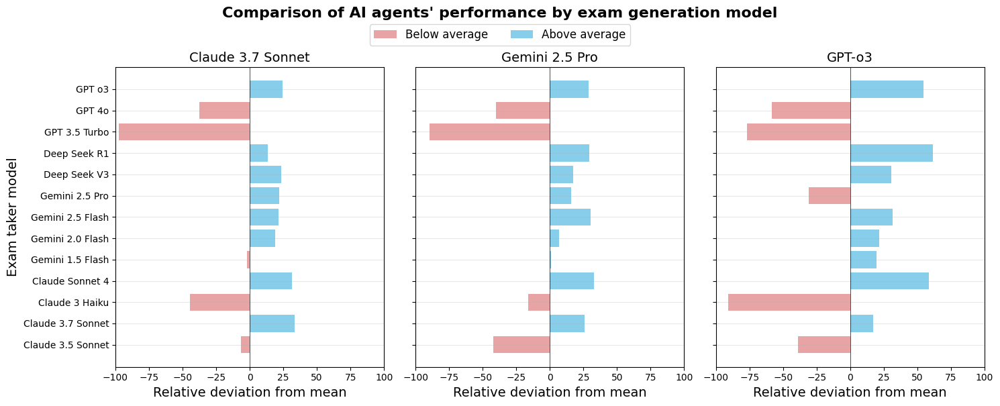

In [560]:

# Create figure with three subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 6))

# Colors for bars (red for below average, blue for above average)
def get_colors(values):
    return ['#E8A4A4' if v < 0 else '#87CEEB' for v in values]

colors_claude = get_colors(claude_37_values)
colors_gemini = get_colors(gemini_25_values)
colors_gpto3 = get_colors(gpt_o3_values)

models =claude_37_values.index.map(model_dict).values
# Left subplot - Claude 3.7 Sonnet
bars1 = ax1.barh(models, claude_37_values, color=colors_claude)
ax1.set_xlabel('Relative deviation from mean', fontsize=14)
ax1.set_ylabel('Exam taker model', fontsize=14)
ax1.set_title('Claude 3.7 Sonnet', fontsize=14)
ax1.axvline(x=0, color='black', linestyle='-', linewidth=0.5)
ax1.set_xlim(-100, 100)
ax1.grid(True, axis='y',alpha=0.3)

# Right subplot - Gemini 2.5 Pro
bars2 = ax2.barh(models, gemini_25_values, color=colors_gemini)
ax2.set_xlabel('Relative deviation from mean', fontsize=14)
ax2.set_title('Gemini 2.5 Pro', fontsize=14)
ax2.axvline(x=0, color='black', linestyle='-', linewidth=0.5)
ax2.set_xlim(-100, 100)
ax2.grid(True, axis='y',alpha=0.3)

# Third subplot - GPT-4o
bars3 = ax3.barh(models, gpt_o3_values, color=colors_gpto3
)
ax3.set_xlabel('Relative deviation from mean', fontsize=14)
ax3.set_title('GPT-o3', fontsize=14)
ax3.axvline(x=0, color='black', linestyle='-', linewidth=0.5)
ax3.set_xlim(-100, 100)
ax3.grid(True, axis='y',alpha=0.3)

# Remove y-axis labels from middle and right subplots to avoid duplication
ax2.set_yticklabels([])
ax3.set_yticklabels([])


# Create legend
legend_elements = [
    plt.Rectangle((0,0),1,1, facecolor='#E8A4A4', label='Below average'),
    plt.Rectangle((0,0),1,1, facecolor='#87CEEB', label='Above average')
]

# Main title (below legend)
fig.suptitle("Comparison of AI agents' performance by exam generation model", 
             fontsize=16, y=1, fontweight='bold')

fig.legend(handles=legend_elements, loc='upper center', 
           bbox_to_anchor=(0.5, 0.97), ncol=2, fontsize=12)
# Adjust layout to prevent overlap
plt.tight_layout()
plt.subplots_adjust(top=0.85)

# Display the plot
plt.show()

In [389]:
test[test['key_grade'].isna()]

,Unnamed: 0.5,Unnamed: 0.4,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,occupation,task_id,task_description,exam_author_model,...,check_real_materials,check_no_internet,failed_candidate_materials,key_grade_threshold,key_grade,answer_key_count,check_overall_makes_sense,explanation_overall_makes_sense,metadata,education
1,1,1,1,1,1,1,General and Operations Managers,20701.0,Prepare staff work schedules and assign specif...,o3-2025-04-16,...,True,True,0.0,100.0,NaN,4.0,True,NaN,{'overview': CompletionUsage(completion_tokens...,Associate's Degree (or other 2-year degree)


In [ ]:
test[

In [3]:
from inspect_ai.analysis.beta import samples_df, evals_df

#df = samples_df('/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/logs/computer_and_mathematical_occupations/2025-07-28T15-06-29+02-00_exams_4sv6ARntkZYVYgPvFtcYsN.eval')

In [11]:
df = samples_df('/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/logs/management_occupations/')

Output()

In [322]:
import os
import pandas as pd
generating_model = 'o3-2025-04-16'#
folder_path = f"/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/exams/basic/{generating_model}/"

occ = "management_occupations"
#occ='computer_and_mathematical_occupations'

#occ = "business_and_financial_operations_occupations"
df=pd.read_csv(folder_path + occ + "_exams.csv")



In [323]:
df[df['exam'] != 'Exam not valid'].shape

(5, 32)

In [324]:
df[df['check_overall_makes_sense'] == True].shape, df[df['check_overall_makes_sense'] == False].shape

((5, 32), (17, 32))

In [235]:
df.loc[df['check_overall_makes_sense'] == True,'exam']= df.loc[df['check_overall_makes_sense'] == True,'instructions'] + df.loc[df['check_overall_makes_sense'] == True,'materials_candidate'] + df.loc[df['check_overall_makes_sense'] == True,'submission']

In [236]:
df.head()

,occupation,task_id,task_description,exam_author_model,tools,materials,level,exam,system_prompt,overview,...,check_real_materials,check_no_internet,failed_candidate_materials,key_grade_threshold,key_grade,answer_key_count,check_overall_makes_sense,explanation_overall_makes_sense,metadata,education
0,Chief Executives,8827.0,"Prepare budgets for approval, including those ...",o3-2025-04-16,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",basic,Exam not valid,You are an excellent examiner of Chief Executi...,REMOTE PRACTICAL EXAM – BASIC LEVEL \nSkill t...,...,True,True,0.0,100.0,100.0,2.0,False,No actual exam content is provided—only placeh...,{'overview': CompletionUsage(completion_tokens...,Master's Degree
1,General and Operations Managers,20701.0,Prepare staff work schedules and assign specif...,o3-2025-04-16,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",basic,BASIC PRACTICAL EXAM – STAFF SCHEDULING \nTim...,You are an excellent examiner of General and O...,----------------------------------------------...,...,True,True,0.0,100.0,NaN,4.0,True,NaN,{'overview': CompletionUsage(completion_tokens...,Associate's Degree (or other 2-year degree)
2,Advertising and Promotions Managers,3225.0,Assist with annual budget development.,o3-2025-04-16,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",basic,Exam not valid,You are an excellent examiner of Advertising a...,OVERVIEW FOR THE EXAM CREATOR & EVALUATOR \nB...,...,True,True,0.0,100.0,100.0,1.0,False,No actual exam content is provided—only placeh...,{'overview': CompletionUsage(completion_tokens...,Bachelor's Degree
3,Sales Managers,4.0,Determine price schedules and discount rates.,o3-2025-04-16,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",basic,Exam not valid,You are an excellent examiner of Sales Manager...,BASIC PRACTICAL EXAM – “DETERMINE PRICE SCHEDU...,...,True,True,0.0,100.0,100.0,2.0,False,No concrete exam content is provided; all sect...,{'overview': CompletionUsage(completion_tokens...,Bachelor's Degree
4,Sales Managers,9.0,Prepare budgets and approve budget expenditures.,o3-2025-04-16,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",basic,Exam not valid,You are an excellent examiner of Sales Manager...,REMOTE PRACTICAL EXAM \n“Prepare a Quarterly ...,...,True,True,0.0,100.0,100.0,1.0,False,No concrete exam content is supplied—only plac...,{'overview': CompletionUsage(completion_tokens...,Bachelor's Degree


In [237]:
df.loc[df['check_overall_makes_sense'] == False, 'exam'] = 'Exam not valid'

In [232]:
df.to_csv(f"{folder_path}{occ}_exams.csv", index=False)

In [77]:
sys.path.append(os.path.abspath('/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/pipeline/'))

from query_agents import query_agent


In [78]:
os.chdir("/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/analysis")

In [398]:
test.groupby(['model'])['submission_valid'].value_counts()

model                                  submission_valid
anthropic/claude-3-5-sonnet-20240620   False               14
                                       True                 4
anthropic/claude-3-7-sonnet-20250219   True                15
                                       False                3
anthropic/claude-3-haiku-20240307      False               16
                                       True                 2
anthropic/claude-sonnet-4-20250514     True                17
                                       False                1
google/gemini-1.5-flash                True                14
                                       False                4
google/gemini-2.0-flash                True                16
                                       False                2
google/gemini-2.5-flash                True                13
                                       False                5
google/gemini-2.5-pro                  False               10
              

In [447]:
test[test['task_id']==18893.0]

,Unnamed: 0,task_id,exam,occupation,score,total_time,input_tokens,output_tokens,total_tokens,reasoning_tokens,model,occupation_group,generating_model,submission_valid
69,69,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,42.00,9.113,8359.0,1171.0,9530.0,0.0,google/gemini-1.5-flash,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True
71,71,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,0.00,11.502,6325.0,300.0,6625.0,0.0,openai/gpt-4o,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,False
192,192,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,37.75,789.627,6440.0,16242.0,22682.0,14694.0,openai-api/deepseek/deepseek-reasoner,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True
231,231,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,0.00,8.120,6884.0,1070.0,7954.0,NaN,anthropic/claude-3-haiku-20240307,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,False
236,236,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,45.25,61.118,6438.0,1084.0,7522.0,NaN,openai-api/deepseek/deepseek-chat,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True
412,412,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,60.00,32.297,6884.0,2043.0,8927.0,NaN,anthropic/claude-sonnet-4-20250514,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True
436,436,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,50.75,162.607,12127.0,2886.0,15013.0,7744.0,openai/o3-2025-04-16,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True
445,445,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,0.00,1.001,6328.0,33.0,6361.0,0.0,openai/gpt-3.5-turbo-0125,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,False
449,449,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,55.50,7.812,8359.0,1190.0,9549.0,0.0,google/gemini-2.0-flash,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True
677,677,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,61.25,23.138,6884.0,1638.0,8522.0,NaN,anthropic/claude-3-7-sonnet-20250219,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True


In [446]:
test[test['model']=='openai/gpt-4o']

,Unnamed: 0,task_id,exam,occupation,score,total_time,input_tokens,output_tokens,total_tokens,reasoning_tokens,model,occupation_group,generating_model,submission_valid
71,71,18893.0,user:\n# Labor Relations Specialist Practical ...,Labor Relations Specialists,0.00,11.502,6325.0,300.0,6625.0,0.0,openai/gpt-4o,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,False
72,72,18950.0,user:\n# Credit Counselor Practical Exam: Crea...,Credit Counselors,95.00,17.094,3257.0,771.0,4028.0,0.0,openai/gpt-4o,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True
73,73,3399.0,user:\n# Budget Analyst Practical Exam (Basic ...,Budget Analysts,49.00,17.146,4081.0,918.0,4999.0,0.0,openai/gpt-4o,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True
617,617,1159.0,user:\n# Basic Practical Exam: Formulating Pro...,"Purchasing Agents, Except Wholesale, Retail, a...",55.90,29.154,2538.0,401.0,2939.0,0.0,openai/gpt-4o,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,True
618,618,20719.0,user:\n# Equal Opportunity Report Preparation ...,Equal Opportunity Representatives and Officers,0.00,38.665,3234.0,42.0,3276.0,0.0,openai/gpt-4o,business_and_financial_operations_occupations,claude-3-7-sonnet-20250219,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1449,1459,1137.0,user:\n# Basic Practical Exam: Budget Planning...,Social and Community Service Managers,39.30,85.218,3263.0,1088.0,4351.0,0.0,openai/gpt-4o,management_occupations,claude-3-7-sonnet-20250219,True
1450,1460,15662.0,user:\n# Investment Fund Manager Staff Evaluat...,Investment Fund Managers,55.00,52.883,8379.0,274.0,8653.0,0.0,openai/gpt-4o,management_occupations,claude-3-7-sonnet-20250219,True
1451,1461,15682.0,user:\n# Supply Chain Manager Practical Exam: ...,Supply Chain Managers,62.45,65.432,4183.0,1171.0,5354.0,0.0,openai/gpt-4o,management_occupations,claude-3-7-sonnet-20250219,True
1452,1462,15762.0,user:\n# Security Manager Budget Development P...,Security Managers,0.00,72.443,3324.0,1013.0,4337.0,0.0,openai/gpt-4o,management_occupations,claude-3-7-sonnet-20250219,True


In [413]:
test[test['score']>0][test['submission_valid'] == False]

/var/folders/6f/4d4gdl2s62qcjzl2lxz8l5zc0000gq/T/ipykernel_49548/1520235873.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  test[test['score']>0][test['submission_valid'] == False]


,Unnamed: 0,task_id,exam,occupation,score,total_time,input_tokens,output_tokens,total_tokens,reasoning_tokens,model,occupation_group,generating_model,submission_valid


In [372]:

def node_check_answer_key(task_id):
    """
    Runs a subprocess to evaluate the answer key for the exam and retrieves the grading results from a JSON file.

    This function:
    1. Constructs the path based on the task ID and exam model.
    2. Runs an external Python script (`task_evaluation.py`) to generate the answer key.
    3. Loads and parses the results from a JSON file (`test_results.json`) to extract the overall score.
    4. Updates the state with the grade and any errors encountered during the process.

    If the script fails or the required files are not found, it captures the errors and stores them in the state.

    Args:
        state (ExamState): A dictionary-like object containing:
            - 'task_id': The identifier for the task.
            - 'exam_author_model': The model of the exam author.
            - 'level': The level of the exam ('advanced' or other).
            - 'errors': A list where error messages will be stored.
            - A `key_grade` entry where the overall score will be stored.

    Returns:
        ExamState: The updated state with:
            - 'key_grade': The overall score from the answer key (or NaN if there was an error).
            - 'errors': A list containing error messages encountered during the process.
    """
    errors = []
    #task_id = row["task_id"]
    subfolder = task_id.replace(".", "_")
    path = "../data/exams/basic/o3-2025-04-16/"  # Adjusted path to match the context
    folder = task_id.replace(".", "_")
    # if state["level"] == "advanced":
    #   path = path + "/advanced" + subfolder + "/"
    # else:
    #   path = path + subfolder + "/"
    #try:
    result = subprocess.run(
        ["python", "task_evaluation.py", "answer_key.json", "answer_key.json"],
        cwd=path,
        check=True,  # Raise an exception if the command fails
        stderr=subprocess.PIPE,  # Capture stderr
        stdout=subprocess.PIPE,  # Capture stdout (if needed)
    )
    print("Script executed successfully.")

    #     # If the script runs successfully, append None to errors list (no errors)
    #     errors.append(None)
    #     # Now get answer key grade
    #     try:
    #         # Load the JSON file
    #         with open(path + "test_results.json", "r") as f:
    #             data = json.load(f)

    #         # Extract the overall_score
    #         overall_score = data.get("overall_score", None)
    #         return np.round(overall_score)
    #     except:
    #         return np.nan
    # except:
    #     return np.nan

In [373]:
node_check_answer_key(str(1150.0))

CalledProcessError: Command '['python', 'task_evaluation.py', 'answer_key.json', 'answer_key.json']' returned non-zero exit status 2.

In [378]:
test[test['task_id']==1150]

,Unnamed: 0,task_id,exam,occupation,score,total_time,input_tokens,output_tokens,total_tokens,reasoning_tokens,model,occupation_group,generating_model,submission_valid
1,1,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,17.352,4056,794,4850,NaN,anthropic/claude-3-7-sonnet-20250219,business_and_financial_operations_occupations,o3-2025-04-16,False
12,12,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,4.600,3782,339,4121,0.0,google/gemini-2.0-flash,business_and_financial_operations_occupations,o3-2025-04-16,False
30,30,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,49.679,3891,343,13211,8977.0,google/gemini-2.5-flash,business_and_financial_operations_occupations,o3-2025-04-16,False
37,37,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,30.944,3393,2797,6190,2496.0,openai/o3-2025-04-16,business_and_financial_operations_occupations,o3-2025-04-16,False
51,51,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,19.232,4056,1555,5611,NaN,anthropic/claude-sonnet-4-20250514,business_and_financial_operations_occupations,o3-2025-04-16,False
64,64,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,14.149,3891,0,4321,430.0,google/gemini-2.5-pro,business_and_financial_operations_occupations,o3-2025-04-16,False
78,78,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,521.187,3543,9935,13478,9235.0,openai-api/deepseek/deepseek-reasoner,business_and_financial_operations_occupations,o3-2025-04-16,False
92,92,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,17.222,4056,1063,5119,NaN,anthropic/claude-3-5-sonnet-20240620,business_and_financial_operations_occupations,o3-2025-04-16,False
100,100,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,43.221,3541,733,4274,NaN,openai-api/deepseek/deepseek-chat,business_and_financial_operations_occupations,o3-2025-04-16,False
119,119,1150.0,user:\nBASIC PRACTICAL EXAM \nEvaluating & Mo...,"Purchasing Agents, Except Wholesale, Retail, a...",0.0,35.077,3394,798,4192,0.0,openai/gpt-4o,business_and_financial_operations_occupations,o3-2025-04-16,False


In [391]:
test.groupby("task_id")["score"].max()

task_id
20.0        73.00
1269.0      55.00
1272.0     100.00
3304.0      65.71
3431.0      70.00
8866.0      76.00
12917.0     10.53
14650.0    100.00
15473.0     70.00
16166.0     78.10
18049.0     96.67
18882.0     47.50
18891.0     96.00
18910.0     13.00
18936.0     85.00
18943.0      0.00
20476.0     92.50
20719.0     95.00
Name: score, dtype: float64

# fix bad formatting

In [266]:
folder_path = f"/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/exams/basic/{generating_model}/"

occ = "management_occupations"
#occ='computer_and_mathematical_occupations'

#occ = "business_and_financial_operations_occupations"
df=pd.read_csv(folder_path + occ + "_exams.csv")

In [275]:
df_checked = pd.read_csv(filename)
df[~df['task_id'].isin(df_checked['task_id'].unique())]

,Unnamed: 0.10,Unnamed: 0.9,Unnamed: 0.8,Unnamed: 0.7,Unnamed: 0.6,Unnamed: 0.5,Unnamed: 0.4,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,...,check_real_materials,check_no_internet,failed_candidate_materials,key_grade_threshold,key_grade,answer_key_count,check_overall_makes_sense,explanation_overall_makes_sense,metadata,education


In [284]:
~df_checked.loc[df_checked['exam']=='Exam not valid','task_id'].isin(df.loc[df['exam']=='Exam not valid','task_id'])

1     False
11    False
23     True
32     True
37    False
40    False
54    False
55    False
Name: task_id, dtype: bool

In [285]:
df_checked.loc[23]

Unnamed: 0.9                                                                      23
Unnamed: 0.8                                                                      23
Unnamed: 0.7                                                                      23
Unnamed: 0.6                                                                      23
Unnamed: 0.5                                                                      23
Unnamed: 0.4                                                                      23
Unnamed: 0.3                                                                      23
Unnamed: 0.2                                                                      23
Unnamed: 0.1                                                                      23
Unnamed: 0                                                                        23
occupation                                            Industrial Production Managers
task_id                                                          

In [258]:
occ='management_occupations'

In [286]:
df_fixed = pd.read_csv(folder_path + occ + "_exams_fixed.csv")

In [292]:
df[df['exam']!='Exam not valid'].shape

(52, 38)

In [290]:
filename= "/Users/einsie0004/Documents/research/21_automatisation/llm_worktask_evaluation/data/exams/basic/gemini-2.5-pro/"+occ + "_exams_sanity_checked.csv"


In [291]:
import pandas as pd

max_field_size = 131072  # same as Python csv default limit

# Step 1: Read with pandas (ignores csv.field_size_limit)
df = pd.read_csv(filename)

# Step 2: Truncate long fields
def truncate_value(val):
    if isinstance(val, str) and len(val) > max_field_size:
        return val[:max_field_size]  # cut off
    return val

df = df.applymap(truncate_value)

# Step 3: Save safely
df.to_csv(fixed_csv, index=False)

/var/folders/6f/4d4gdl2s62qcjzl2lxz8l5zc0000gq/T/ipykernel_49548/3264453768.py:14: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(truncate_value)


In [178]:
inputcsv = pd.read_csv(input_csv)

In [179]:
inputcsv.shape

(21, 29)

In [169]:
test2 =pd.read_csv(fixed_csv)

In [170]:
test2.shape

(60, 38)

In [12]:

# Safely parse JSON
def safe_parse_json(s):
    try:
        return json.loads(s)
    except:
        return {}

df["model_usage_parsed"] = df["model_usage"].apply(safe_parse_json)

# Flatten with safety check
def flatten_usage(usage_dict):
    if not usage_dict:
        return {"model": None}
    model = next(iter(usage_dict))
    data = usage_dict[model]
    data["model"] = model
    return data

# Apply and expand
usage_expanded = df["model_usage_parsed"].apply(flatten_usage).apply(pd.Series)
# Merge
df = pd.concat([df, usage_expanded], axis=1)

# Optional cleanup
df = df.drop(columns=["model_usage", "model_usage_parsed"])

In [9]:
df

,sample_id,eval_id,id,epoch,input,target,metadata_answer_key,metadata_grading,metadata_occupation,metadata_task_id,...,error,limit,retries,input_tokens,output_tokens,total_tokens,reasoning_tokens,model,input_tokens_cache_read,input_tokens_cache_write
0,iW3w8huoKJd5yUBtboJCcc,GG82XKdQ642DzLUc2danVY,16166.0,1,user: # IT Project Budget Development Practica...,,"{'candidate_id': 'EVALUATOR_KEY', 'part1': {'c...",I'll create a Python script that evaluates a c...,Information Technology Project Managers,16166.0,...,,<NA>,0,4322,672,4994,0.0,google/gemini-1.5-flash,NaN,NaN
1,WyWuWr3tJkErca8NdAD3uF,GG82XKdQ642DzLUc2danVY,3442.0,1,"user: # Basic Practical Exam: Data Storage, Re...",,"{'task1': {'customer_count': 10, 'product_coun...",I'll create a Python script that evaluates a c...,"Software Developers, Applications",3442.0,...,,<NA>,0,7142,701,7843,0.0,google/gemini-1.5-flash,NaN,NaN
2,2PDoQXXvP5LvZCD4s55qLo,GG82XKdQ642DzLUc2danVY,3455.0,1,"user: # Basic Practical Exam: Data Storage, Re...",,"{'part1': {'testResults': {'test1': True, 'tes...",I'll create a Python script that evaluates a c...,"Software Developers, Systems Software",3455.0,...,,<NA>,0,5858,1428,7286,0.0,google/gemini-1.5-flash,NaN,NaN
3,8w8Sb2WtBSwQXw8QGNFWmD,GG82XKdQ642DzLUc2danVY,16167.0,1,user: # Basic Practical Exam: IT Project Manag...,,{'role_assignments': [{'team_member_id': 'TM00...,I'll create a Python script that evaluates a c...,Information Technology Project Managers,16167.0,...,,<NA>,0,2758,1491,4249,0.0,google/gemini-1.5-flash,NaN,NaN
4,DXUtUccwynAN6QJ6JadsFu,GG82XKdQ642DzLUc2danVY,14658.0,1,user: # Standards Compliance Assessment Practi...,,"{'sample1': [{'standard_reference': '1.1.1', '...",I'll create a Python script that evaluates a c...,Software Quality Assurance Engineers and Testers,14658.0,...,,<NA>,0,4626,1718,6344,0.0,google/gemini-1.5-flash,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,8cBvfp9i8C4ceBMrotqPxz,3iPssDWRipgBZdF2axLboT,16187.0,1,user: # Basic Practical Exam: Financial Modeli...,,{'metrics_calculation': {'q1': {'Search': 1.08...,I'll create a Python script that evaluates a c...,Search Marketing Strategists,16187.0,...,,<NA>,0,2918,585,3503,0.0,openai/gpt-4o,0.0,NaN
156,3TK5cE9GwpHMwg2oZQe7PP,3iPssDWRipgBZdF2axLboT,16164.0,1,user: # Basic Practical Exam: IT Project Imple...,,{'implementation_plan': {'phases': [{'phase_na...,I'll create a Python script that evaluates a c...,Information Technology Project Managers,16164.0,...,,<NA>,0,2167,946,3113,0.0,openai/gpt-4o,0.0,NaN
157,oTZKvGAKLJY3RTQxtZkw6Q,3iPssDWRipgBZdF2axLboT,3509.0,1,user: # Basic Practical Exam: Determining Poli...,,{'part1': {'life_policy': {'selected_provision...,I'll create a Python script that evaluates a c...,Actuaries,3509.0,...,,<NA>,0,5965,35,6000,0.0,openai/gpt-4o,0.0,NaN
158,KX3kCaBkEJhM4PVJxVjb9G,3iPssDWRipgBZdF2axLboT,3508.0,1,user: # Actuarial Probability Table Constructi...,,{'regional_probabilities': [{'region': 'North'...,I'll create a Python script that evaluates a c...,Actuaries,3508.0,...,,<NA>,0,8496,791,9287,0.0,openai/gpt-4o,0.0,NaN


In [13]:
df.groupby('model').size()

model
anthropic/claude-3-5-sonnet-20240620     42
anthropic/claude-3-7-sonnet-20250219     84
google/gemini-1.5-flash                  42
google/gemini-2.0-flash                  42
google/gemini-2.5-flash                  42
openai-api/deepseek/deepseek-chat        42
openai-api/deepseek/deepseek-reasoner    42
openai/gpt-3.5-turbo-0125                42
openai/gpt-4o                            42
openai/o3-2025-04-16                     42
dtype: int64

In [15]:
df.head()

,sample_id,eval_id,id,epoch,input,target,metadata_answer_key,metadata_grading,metadata_occupation,metadata_task_id,score_runScoringScripts,model_usage,total_time,working_time,error,limit,retries
0,Py9EPWqfuRZDo8B4b8dZE3,5iwq5xEJtr5PoqAvFbPS3j,1267.0,1,user: # Practical Exam: Error Correction in Co...,,{'part1': {'calculate_area': 'def calculate_ar...,I'll create a Python script that evaluates a c...,Computer Programmers,1267.0,50.0,"{""anthropic/claude-3-7-sonnet-20250219"": {""inp...",72.75,72.75,,<NA>,0
1,YHLJ4h5ZzocFExp2Z5ws8o,5iwq5xEJtr5PoqAvFbPS3j,3442.0,1,"user: # Basic Practical Exam: Data Storage, Re...",,"{'task1': {'customer_count': 10, 'product_coun...",I'll create a Python script that evaluates a c...,"Software Developers, Applications",3442.0,49.0,"{""anthropic/claude-3-7-sonnet-20250219"": {""inp...",79.348,79.348,,<NA>,0
2,E9CcMDjnxawzK5s7a57HEa,5iwq5xEJtr5PoqAvFbPS3j,16167.0,1,user: # Basic Practical Exam: IT Project Manag...,,{'role_assignments': [{'team_member_id': 'TM00...,I'll create a Python script that evaluates a c...,Information Technology Project Managers,16167.0,82.0,"{""anthropic/claude-3-7-sonnet-20250219"": {""inp...",85.798,85.798,,<NA>,0
3,Htz4KQDPBKaaqMYYVnyJBn,5iwq5xEJtr5PoqAvFbPS3j,1268.0,1,user: # Basic Practical Exam: Program Trial Ru...,,{'discrepancies': [{'transaction_id': 'general...,I'll create a Python script that evaluates a c...,Computer Programmers,1268.0,16.67,"{""anthropic/claude-3-7-sonnet-20250219"": {""inp...",86.531,86.531,,<NA>,0
4,KmEMKxjQ7nckfUJm2rt3Xj,5iwq5xEJtr5PoqAvFbPS3j,1272.0,1,user: # Basic Practical Exam: Program Revision...,,"{'part1': {'fixed_code': '""""""Inventory Managem...",I'll create a Python script that evaluates a c...,Computer Programmers,1272.0,0.0,"{""anthropic/claude-3-7-sonnet-20250219"": {""inp...",88.85,88.85,,<NA>,0


In [181]:
experiments[(experiments['materials.Images']=='Not Required')*(experiments['materials.Audio files']=='Not Required')*\
(experiments['materials.Video files']=='Not Required')*(experiments['materials.Virtual labs']=='Not Required')*(experiments['materials.Specialized files']=='Not Required')*\
(experiments['tools.Code execution environment']=='Not Required')*(experiments['tools.Image viewer']=='Not Required')* (experiments['tools.Image generator']=='Not Required')*(experiments['tools.Presentation software']=='Not Required')*(experiments['tools.Online search engine']=='Not Required')*(experiments['tools.Video conferencing']=='Not Required')*(experiments['tools.Chat interfaces']=='Not Required')*(experiments['tools.Email client']=='Not Required')*(experiments['tools.Specialized software']=='Not Required')*(experiments['tools.Internet access']=='Not Required')]

,Unnamed: 0,row,prompt,task_id,occupation,task_description,can_be_performed_remotely,feasibility_practical,chain_of_thought,materials.Text,...,tools.Online search engine,tools.Video conferencing,tools.Chat interfaces,tools.Email client,tools.Internet access,tools.Specialized software,tools.Specialized software:,required_tools,required_materials,occupation_group
79,79,79,Task ID: 10834\n\nYour assignment is to determ...,10834.0,Environmental Compliance Inspectors,Monitor follow-up actions in cases where viola...,True,True,Inspectors can track corrective action deadlin...,Required,...,Not Required,Not Required,Not Required,Not Required,Not Required,Not Required,NaN,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",business_and_financial_operations_occupations
85,85,85,Task ID: 10848\n\nYour assignment is to determ...,10848.0,Environmental Compliance Inspectors,Review and evaluate applications for registrat...,True,True,Permit/application review involves reading doc...,Required,...,Not Required,Not Required,Not Required,Not Required,Not Required,Not Required,NaN,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",business_and_financial_operations_occupations
107,107,107,Task ID: 12890\n\nYour assignment is to determ...,12890.0,Government Property Inspectors and Investigators,"Prepare correspondence, reports of inspections...",True,True,Writing inspection reports is desk work; sourc...,Required,...,Not Required,Not Required,Not Required,Not Required,Not Required,Not Required,NaN,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",business_and_financial_operations_occupations
154,154,154,Task ID: 87\n\nYour assignment is to determine...,87.0,Cost Estimators,Prepare cost and expenditure statements and ot...,True,True,The task involves analyzing provided project c...,Required,...,Not Required,Not Required,Not Required,Not Required,Not Required,Not Required,NaN,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",business_and_financial_operations_occupations
172,172,172,Task ID: 18855\n\nYour assignment is to determ...,18855.0,Human Resources Specialists,Conduct reference or background checks on job ...,True,True,Reference/background checks can be carried out...,Required,...,Not Required,Not Required,Not Required,Not Required,Not Required,Not Required,NaN,['Text editor'],"['Text', 'Data']",business_and_financial_operations_occupations
204,204,204,Task ID: 18893\n\nYour assignment is to determ...,18893.0,Labor Relations Specialists,Review employer practices or employee data to ...,True,True,Compliance review can be done from any locatio...,Required,...,Not Required,Not Required,Not Required,Not Required,Not Required,Not Required,NaN,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",business_and_financial_operations_occupations
241,241,241,Task ID: 19998\n\nYour assignment is to determ...,19998.0,Logistics Engineers,"Evaluate the use of technologies, such as glob...",True,True,"Candidate can be given route, RFID read, and G...",Required,...,Not Required,Not Required,Not Required,Not Required,Not Required,Not Required,NaN,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",business_and_financial_operations_occupations
295,295,295,Task ID: 18910\n\nYour assignment is to determ...,18910.0,Fundraisers,Develop fundraising activity plans that maximi...,True,True,Planning fundraising activities is essentially...,Required,...,Not Required,Not Required,Not Required,Not Required,Not Required,Not Required,NaN,"['Spreadsheet software', 'Text editor']","['Text', 'Data']",business_and_financial_operations_occupations
320,320,320,Task ID: 3353\n\nYour assignment is to determi...,3353.0,"Compensation, Benefits, and Job Analysis Speci...",Advise managers and employees on state and fed...,True,True,Advising on regulations and policies can be do...,Required,...,Not Required,Not Required,Not Required,Not Required,Not Required,Not Required,NaN,"['Spreadsheet software', 'Text editor']","['Text', 'Data'

In [134]:
experiments

,Unnamed: 0,row,prompt,task_id,occupation,task_description,can_be_performed_remotely,feasibility_practical,chain_of_thought,materials.Text,...,tools.Online search engine,tools.Video conferencing,tools.Chat interfaces,tools.Email client,tools.Internet access,tools.Specialized software,tools.Specialized software:,required_tools,required_materials,occupation_group
0,0,0,Task ID: 12865\n\nYour assignment is to determ...,12865.0,"Agents and Business Managers of Artists, Perfo...","Collect fees, commissions, or other payments, ...",True,True,"Collecting fees, commissions, or other payment...",Required,...,Not Required,Not Required,Not Required,Required,Required,Not Required,NaN,"['Spreadsheet software', 'Text editor', 'Email...","['Text', 'Data']",business_and_financial_operations_occupations
1,1,1,Task ID: 12866\n\nYour assignment is to determ...,12866.0,"Agents and Business Managers of Artists, Perfo...",Confer with clients to develop strategies for ...,True,True,The task of conferring with clients to develop...,Required,...,Required,Required,Required,Required,Required,Not Required,NaN,"['Spreadsheet software', 'Text editor', 'Prese...","['Text', 'Data']",business_and_financial_operations_occupations
2,2,2,Task ID: 12867\n\nYour assignment is to determ...,12867.0,"Agents and Business Managers of Artists, Perfo...",Develop contacts with individuals and organiza...,True,True,Developing contacts and applying strategies ca...,Required,...,Required,Required,Required,Required,Required,Not Required,NaN,"['Text editor', 'Presentation software', 'Onli...",['Text'],business_and_financial_operations_occupations
3,3,3,Task ID: 12868\n\nYour assignment is to determ...,12868.0,"Agents and Business Managers of Artists, Perfo...",Schedule promotional or performance engagement...,True,True,Scheduling promotional or performance engageme...,Required,...,Required,Not Required,Required,Required,Required,Not Required,NaN,"['Spreadsheet software', 'Text editor', 'Onlin...","['Text', 'Data']",business_and_financial_operations_occupations
4,4,4,Task ID: 12869\n\nYour assignment is to determ...,12869.0,"Agents and Business Managers of Artists, Perfo...","Negotiate with managers, promoters, union offi...",True,True,Negotiating contractual rights and obligations...,Required,...,Required,Required,Required,Required,Required,Not Required,NaN,"['Text editor', 'Online search engine', 'Video...",['Text'],business_and_financial_operations_occupations
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,863,863,Task ID: 15840\n\nYour assignment is to determ...,15840.0,Brownfield Redevelopment Specialists and Site ...,Review or evaluate designs for contaminant tre...,True,True,Reviewing or evaluating designs for contaminan...,Required,...,Required,Not Required,Not Required,Not Required,Required,Required,NaN,"['Spreadsheet software', 'Image viewer', 'Text...","['Text', 'Data', 'Images', 'Specialized files']",management_occupations
2102,864,864,Task ID: 15854\n\nYour assignment is to determ...,15854.0,Brownfield Redevelopment Specialists and Site ...,Design or implement measures to improve the wa...,True,True,The task of designing or implementing measures...,Required,...,Required,Not Required,Not Required,Not Required,Required,Required,NaN,"['Spreadsheet software', 'Image viewer', 'Text...","['Text', 'Data', 'Images', 'Virtual labs']",management_occupations
2103,865,865,Task ID: 15853\n\nYour assignment is to determ...,15853.0,Brownfield Redevelopment Specialists and Site ...,Design or implement plans for structural demol...,True,True,Designing or implementing plans for structural...,Required,...,Required,Not Required,Not Required,Not Required,Required,Required,NaN,"['Spreadsheet software', 'Image viewer', 'Text...","['Text', 'Data', 'Images']",management_occupations
2104,866,866,Task ID: 15841\n\nYour assignment is to determ...,15841.0,Brownfield Redevelopment Specialists and Site ...,Provide training on hazardous material or wa

In [166]:

df = experiments.dropna(subset=['required_materials', 'required_tools'])
# Ensure 'required_materials' column is a list, not a string
df['required_materials'] = df['required_materials'].apply(ast.literal_eval)

# Filter rows where required_materials == ['Text', 'Data'] (order-independent)
filtered_df = df[df['required_materials'].apply(lambda x: sorted(x) == ['Data', 'Text'])]

/var/folders/6f/4d4gdl2s62qcjzl2lxz8l5zc0000gq/T/ipykernel_4273/3233218997.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['required_materials'] = df['required_materials'].apply(ast.literal_eval)


In [182]:

df = experiments.dropna(subset=['required_materials', 'required_tools'])
# Ensure 'required_materials' column is a list, not a string
df['required_tools'] = df['required_tools'].apply(ast.literal_eval)

# Filter rows where required_materials == ['Text', 'Data'] (order-independent)
filtered_df = df[df['required_tools'].apply(lambda x: sorted(x) == ['Spreadsheet software', 'Text editor'])]

/var/folders/6f/4d4gdl2s62qcjzl2lxz8l5zc0000gq/T/ipykernel_4273/205559313.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['required_tools'] = df['required_tools'].apply(ast.literal_eval)


In [151]:
filtered_df['required_tools'].value_counts()

required_tools
[Spreadsheet software, Text editor]    111
Name: count, dtype: int64

In [183]:
def contains_target_values(entry):
    llm_tools =  []
    try:
        parsed_list = ast.literal_eval(entry)  # safely parse string to list
        if any(item in parsed_list for item in ['Online search engine']):
            llm_tools.append('Web search')
        if any(item in parsed_list for item in ['Code execution environment']):
            llm_tools.append('Bash and Python')
        if any(item in parsed_list for item in ['Image viewer', 'Email client']):
               llm_tools.append('Function calling')
        if any(item in parsed_list for item in ['Presentation software','Video conferencing','Chat interfaces','Specialized software']):
            llm_tools.append('Computer use')
        if any(item in parsed_list for item in ['Image generator']):
            llm_tools.append('Image generation')
        if any(item in parsed_list for item in ['Internet access']):
            llm_tools.append('Web browser')
        return llm_tools
    except (ValueError, SyntaxError):
        return False  # handle malformed strings


In [185]:
experiments['LLM_tools'] = experiments['required_tools'].apply(contains_target_values)
def ensure_iterable(x):
    if isinstance(x, bool):  # or you can check if not iterable
        return []
    elif isinstance(x, str):
        return [x]  # wrap string into list
    else:
        return x

experiments['LLM_tools'] = experiments['LLM_tools'].apply(ensure_iterable)

In [ ]:
d

In [187]:
experiments[experiments['LLM_tools'].apply(lambda x: isinstance(x, list) and len(x)==0)]['required_materials'].explode().value_counts()

required_materials
['Text', 'Data']    62
['Text']            11
['Data']             2
Name: count, dtype: int64

In [172]:
# Convert list of label lists to a binary indicator DataFrame
mlb = MultiLabelBinarizer()
binary_matrix = mlb.fit_transform(list(experiments['LLM_tools']))
df_labels = pd.DataFrame(binary_matrix, columns=mlb.classes_).astype(bool)
df_labels = pd.concat([df_labels, experiments['occupation_group'].reset_index()], axis=1).drop('index',axis=1)

In [104]:
experiments['LLM_tools']

0                         [Function calling, Web browser]
1       [Web search, Function calling, Computer use, W...
2       [Web search, Function calling, Computer use, W...
3       [Web search, Function calling, Computer use, W...
4       [Web search, Function calling, Computer use, W...
                              ...                        
2101    [Web search, Function calling, Computer use, W...
2102    [Web search, Function calling, Computer use, W...
2103    [Web search, Function calling, Computer use, W...
2104        [Function calling, Computer use, Web browser]
2105    [Web search, Function calling, Computer use, W...
Name: LLM_tools, Length: 1937, dtype: object

In [103]:
df_labels

,Bash and Python,Computer use,Function calling,Image generation,Web browser,Web search,occupation_group
0,False,False,True,False,True,False,business_and_financial_operations_occupations
1,False,True,True,False,True,True,business_and_financial_operations_occupations
2,False,True,True,False,True,True,business_and_financial_operations_occupations
3,False,True,True,False,True,True,business_and_financial_operations_occupations
4,False,True,True,False,True,True,business_and_financial_operations_occupations
...,...,...,...,...,...,...,...
1932,False,True,True,False,True,True,management_occupations
1933,False,True,True,False,True,True,management_occupations
1934,False,True,True,False,True,True,management_occupations
1935,False,True,True,False,True,False,management_occupations


In [ ]:

    multi_index = pd.MultiIndex.from_frame(df_labels[['Bash and Python', 'Function calling', 'Computer use','Image generation', 'Web search','Web browser']], names=['Bash and Python', 'Function calling', 'Computer use','Image generation', 'Web search','Web browser'] )

In [83]:
import typing
import warnings

import matplotlib
import numpy as np
import pandas as pd
from matplotlib import colors, patches
from matplotlib import pyplot as plt


# prevents ImportError on matplotlib versions >3.5.2
try:
    from matplotlib.tight_layout import get_renderer

    RENDERER_IMPORTED = True
except ImportError:
    RENDERER_IMPORTED = False


def _process_data(
    df,
    *,
    sort_by,
    sort_categories_by,
    subset_size,
    sum_over,
    min_subset_size=None,
    max_subset_size=None,
    max_subset_rank=None,
    min_degree=None,
    max_degree=None,
    reverse=False,
    include_empty_subsets=False,
):
    results = query(
        df,
        sort_by=sort_by,
        sort_categories_by=sort_categories_by,
        subset_size=subset_size,
        sum_over=sum_over,
        min_subset_size=min_subset_size,
        max_subset_size=max_subset_size,
        max_subset_rank=max_subset_rank,
        min_degree=min_degree,
        max_degree=max_degree,
        include_empty_subsets=include_empty_subsets,
    )

    df = results.data
    agg = results.subset_sizes

    # add '_bin' to df indicating index in agg
    # XXX: ugly!
    def _pack_binary(X):
        X = pd.DataFrame(X)
        # use objects if arbitrary precision integers are needed
        dtype = np.object_ if X.shape[1] > 62 else np.uint64
        out = pd.Series(0, index=X.index, dtype=dtype)
        for _, col in X.items():
            out *= 2
            out += col
        return out

    df_packed = _pack_binary(df.index.to_frame())
    data_packed = _pack_binary(agg.index.to_frame())
    df["_bin"] = pd.Series(df_packed).map(
        pd.Series(
            np.arange(len(data_packed))[:: -1 if reverse else 1], index=data_packed
        )
    )
    if reverse:
        agg = agg[::-1]

    return results.total, df, agg, results.category_totals


def _multiply_alpha(c, mult):
    r, g, b, a = colors.to_rgba(c)
    a *= mult
    return colors.to_hex((r, g, b, a), keep_alpha=True)


class _Transposed:
    """Wrap an object in order to transpose some plotting operations

    Attributes of obj will be mapped.
    Keyword arguments when calling obj will be mapped.

    The mapping is not recursive: callable attributes need to be _Transposed
    again.
    """

    def __init__(self, obj):
        self.__obj = obj

    def __getattr__(self, key):
        return getattr(self.__obj, self._NAME_TRANSPOSE.get(key, key))

    def __call__(self, *args, **kwargs):
        return self.__obj(
            *args, **{self._NAME_TRANSPOSE.get(k, k): v for k, v in kwargs.items()}
        )

    _NAME_TRANSPOSE = {
        "align_xlabels": "align_ylabels",
        "align_ylabels": "align_xlabels",
        "bar": "barh",
        "barh": "bar",
        "bottom": "left",
        "get_figheight": "get_figwidth",
        "get_figwidth": "get_figheight",
        "get_xlim": "get_ylim",
        "get_ylim": "get_xlim",
        "height": "width",
        "hlines": "vlines",
        "hspace": "wspace",
        "left": "bottom",
        "right": "top",
        "set_autoscalex_on": "set_autoscaley_on",
        "set_autoscaley_on": "set_autoscalex_on",
        "set_figheight": "set_figwidth",
        "set_figwidth": "set_figheight",
        "set_xlabel": "set_ylabel",
        "set_xlim": "set_ylim",
        "set_ylabel": "set_xlabel",
        "set_ylim": "set_xlim",
        "sharex": "sharey",
        "sharey": "sharex",
        "top": "right",
        "vlines": "hlines",
        "width": "height",
        "wspace": "hspace",
        "xaxis": "yaxis",
        "yaxis": "xaxis",
    }


def _transpose(obj):
    if isinstance(obj, str):
        return _Transposed._NAME_TRANSPOSE.get(obj, obj)
    return _Transposed(obj)


def _identity(obj):
    return obj


class UpSet:
    """Manage the data and drawing for a basic UpSet plot

    Primary public method is :meth:`plot`.

    Parameters
    ----------
    data : pandas.Series or pandas.DataFrame
        Elements associated with categories (a DataFrame), or the size of each
        subset of categories (a Series).
        Should have MultiIndex where each level is binary,
        corresponding to category membership.
        If a DataFrame, `sum_over` must be a string or False.
    orientation : {'horizontal' (default), 'vertical'}
        If horizontal, intersections are listed from left to right.
    sort_by : {'cardinality', 'degree', '-cardinality', '-degree',
               'input', '-input'}
        If 'cardinality', subset are listed from largest to smallest.
        If 'degree', they are listed in order of the number of categories
        intersected. If 'input', the order they appear in the data input is
        used.
        Prefix with '-' to reverse the ordering.

        Note this affects ``subset_sizes`` but not ``data``.
    sort_categories_by : {'cardinality', '-cardinality', 'input', '-input'}
        Whether to sort the categories by total cardinality, or leave them
        in the input data's provided order (order of index levels).
        Prefix with '-' to reverse the ordering.
    subset_size : {'auto', 'count', 'sum'}
        Configures how to calculate the size of a subset. Choices are:

        'auto' (default)
            If `data` is a DataFrame, count the number of rows in each group,
            unless `sum_over` is specified.
            If `data` is a Series with at most one row for each group, use
            the value of the Series. If `data` is a Series with more than one
            row per group, raise a ValueError.
        'count'
            Count the number of rows in each group.
        'sum'
            Sum the value of the `data` Series, or the DataFrame field
            specified by `sum_over`.
    sum_over : str or None
        If `subset_size='sum'` or `'auto'`, then the intersection size is the
        sum of the specified field in the `data` DataFrame. If a Series, only
        None is supported and its value is summed.
    min_subset_size : int or "number%", optional
        Minimum size of a subset to be shown in the plot. All subsets with
        a size smaller than this threshold will be omitted from plotting.
        This may be specified as a percentage
        using a string, like "50%".
        Size may be a sum of values, see `subset_size`.

        .. versionadded:: 0.5

        .. versionchanged:: 0.9
            Support percentages
    max_subset_size : int or "number%", optional
        Maximum size of a subset to be shown in the plot. All subsets with
        a size greater than this threshold will be omitted from plotting.
        This may be specified as a percentage
        using a string, like "50%".

        .. versionadded:: 0.5

        .. versionchanged:: 0.9
            Support percentages
    max_subset_rank : int, optional
        Limit to the top N ranked subsets in descending order of size.
        All tied subsets are included.

        .. versionadded:: 0.9
    min_degree : int, optional
        Minimum degree of a subset to be shown in the plot.

        .. versionadded:: 0.5
    max_degree : int, optional
        Maximum degree of a subset to be shown in the plot.

        .. versionadded:: 0.5
    facecolor : 'auto' or matplotlib color or float
        Color for bar charts and active dots. Defaults to black if
        axes.facecolor is a light color, otherwise white.

        .. versionchanged:: 0.6
            Before 0.6, the default was 'black'
    other_dots_color : matplotlib color or float
        Color for shading of inactive dots, or opacity (between 0 and 1)
        applied to facecolor.

        .. versionadded:: 0.6
    shading_color : matplotlib color or float
        Color for shading of odd rows in matrix and totals, or opacity (between
        0 and 1) applied to facecolor.

        .. versionadded:: 0.6
    with_lines : bool
        Whether to show lines joining dots in the matrix, to mark multiple
        categories being intersected.
    element_size : float or None
        Side length in pt. If None, size is estimated to fit figure
    intersection_plot_elements : int
        The intersections plot should be large enough to fit this many matrix
        elements. Set to 0 to disable intersection size bars.

        .. versionchanged:: 0.4
            Setting to 0 is handled.
    totals_plot_elements : int
        The totals plot should be large enough to fit this many matrix
        elements. Set to 0 to disable the totals plot.

        .. versionchanged:: 0.9
            Setting to 0 is handled.
    show_counts : bool or str, default=False
        Whether to label the intersection size bars with the cardinality
        of the intersection. When a string, this formats the number.
        For example, '{:d}' is equivalent to True.
        Note that, for legacy reasons, if the string does not contain '{',
        it will be interpreted as a C-style format string, such as '%d'.
    show_percentages : bool or str, default=False
        Whether to label the intersection size bars with the percentage
        of the intersection relative to the total dataset.
        When a string, this formats the number representing a fraction of
        samples.
        For example, '{:.1%}' is the default, formatting .123 as 12.3%.
        This may be applied with or without show_counts.

        .. versionadded:: 0.4
    include_empty_subsets : bool (default=False)
        If True, all possible category combinations will be shown as subsets,
        even when some are not present in data.
    """

    _default_figsize = (10, 6)
    DPI = 100  # standard matplotlib value

    def __init__(
        self,
        data,
        orientation="horizontal",
        sort_by="degree",
        sort_categories_by="cardinality",
        subset_size="auto",
        sum_over=None,
        min_subset_size=None,
        max_subset_size=None,
        max_subset_rank=None,
        min_degree=None,
        max_degree=None,
        facecolor="auto",
        other_dots_color=0.18,
        shading_color=0.05,
        with_lines=True,
        element_size=32,
        intersection_plot_elements=6,
        totals_plot_elements=2,
        show_counts="",
        show_percentages=False,
        include_empty_subsets=False,
    ):
        self._horizontal = orientation == "horizontal"
        self._reorient = _identity if self._horizontal else _transpose
        if facecolor == "auto":
            bgcolor = matplotlib.rcParams.get("axes.facecolor", "white")
            r, g, b, a = colors.to_rgba(bgcolor)
            lightness = colors.rgb_to_hsv((r, g, b))[-1] * a
            facecolor = "black" if lightness >= 0.5 else "white"
        self._facecolor = facecolor
        self._shading_color = (
            _multiply_alpha(facecolor, shading_color)
            if isinstance(shading_color, float)
            else shading_color
        )
        self._other_dots_color = (
            _multiply_alpha(facecolor, other_dots_color)
            if isinstance(other_dots_color, float)
            else other_dots_color
        )
        self._with_lines = with_lines
        self._element_size = element_size
        self._totals_plot_elements = totals_plot_elements
        self._subset_plots = [
            {
                "type": "default",
                "id": "intersections",
                "elements": intersection_plot_elements,
            }
        ]
        if not intersection_plot_elements:
            self._subset_plots.pop()
        self._show_counts = show_counts
        self._show_percentages = show_percentages

        (self.total, self._df, self.intersections, self.totals) = _process_data(
            data,
            sort_by=sort_by,
            sort_categories_by=sort_categories_by,
            subset_size=subset_size,
            sum_over=sum_over,
            min_subset_size=min_subset_size,
            max_subset_size=max_subset_size,
            max_subset_rank=max_subset_rank,
            min_degree=min_degree,
            max_degree=max_degree,
            reverse=not self._horizontal,
            include_empty_subsets=include_empty_subsets,
        )
        self.category_styles = {}
        self.subset_styles = [
            {"facecolor": facecolor} for i in range(len(self.intersections))
        ]
        self.subset_legend = []  # pairs of (style, label)

    def _swapaxes(self, x, y):
        if self._horizontal:
            return x, y
        return y, x

    def style_subsets(
        self,
        present=None,
        absent=None,
        min_subset_size=None,
        max_subset_size=None,
        max_subset_rank=None,
        min_degree=None,
        max_degree=None,
        facecolor=None,
        edgecolor=None,
        hatch=None,
        linewidth=None,
        linestyle=None,
        label=None,
    ):
        """Updates the style of selected subsets' bars and matrix dots

        Parameters are either used to select subsets, or to style them with
        attributes of :class:`matplotlib.patches.Patch`, apart from label,
        which adds a legend entry.

        Parameters
        ----------
        present : str or list of str, optional
            Category or categories that must be present in subsets for styling.
        absent : str or list of str, optional
            Category or categories that must not be present in subsets for
            styling.
        min_subset_size : int or "number%", optional
            Minimum size of a subset to be styled.
            This may be specified as a percentage using a string, like "50%".

            .. versionchanged:: 0.9
                Support percentages
        max_subset_size : int or "number%", optional
            Maximum size of a subset to be styled.
            This may be specified as a percentage using a string, like "50%".

            .. versionchanged:: 0.9
                Support percentages
        max_subset_rank : int, optional
            Limit to the top N ranked subsets in descending order of size.
            All tied subsets are included.

            .. versionadded:: 0.9
        min_degree : int, optional
            Minimum degree of a subset to be styled.
        max_degree : int, optional
            Maximum degree of a subset to be styled.

        facecolor : str or matplotlib color, optional
            Override the default UpSet facecolor for selected subsets.
        edgecolor : str or matplotlib color, optional
            Set the edgecolor for bars, dots, and the line between dots.
        hatch : str, optional
            Set the hatch. This will apply to intersection size bars, but not
            to matrix dots.
        linewidth : int, optional
            Line width in points for edges.
        linestyle : str, optional
            Line style for edges.

        label : str, optional
            If provided, a legend will be added
        """
        style = {
            "facecolor": facecolor,
            "edgecolor": edgecolor,
            "hatch": hatch,
            "linewidth": linewidth,
            "linestyle": linestyle,
        }
        style = {k: v for k, v in style.items() if v is not None}
        mask = _get_subset_mask(
            self.intersections,
            present=present,
            absent=absent,
            min_subset_size=min_subset_size,
            max_subset_size=max_subset_size,
            max_subset_rank=max_subset_rank,
            min_degree=min_degree,
            max_degree=max_degree,
        )
        for idx in np.flatnonzero(mask):
            self.subset_styles[idx].update(style)

        if label is not None:
            if "facecolor" not in style:
                style["facecolor"] = self._facecolor
            for i, (other_style, other_label) in enumerate(self.subset_legend):
                if other_style == style:
                    if other_label != label:
                        self.subset_legend[i] = (style, other_label + "; " + label)
                    break
            else:
                self.subset_legend.append((style, label))

    def _plot_bars(self, ax, data, title, colors=None, use_labels=False):
        ax = self._reorient(ax)
        ax.set_autoscalex_on(False)
        data_df = pd.DataFrame(data)
        if self._horizontal:
            data_df = data_df.loc[:, ::-1]  # reverse: top row is top of stack

        # TODO: colors should be broadcastable to data_df shape
        if callable(colors):
            colors = colors(range(data_df.shape[1]))
        elif isinstance(colors, (str, type(None))):
            colors = [colors] * len(data_df)

        if self._horizontal:
            colors = reversed(colors)

        x = np.arange(len(data_df))
        cum_y = None
        all_rects = []
        for (name, y), color in zip(data_df.items(), colors):
            rects = ax.bar(
                x,
                y,
                0.5,
                cum_y,
                color=color,
                zorder=10,
                label=name if use_labels else None,
                align="center",
            )
            cum_y = y if cum_y is None else cum_y + y
            all_rects.extend(rects)

        self._label_sizes(ax, rects, "top" if self._horizontal else "right")

        ax.xaxis.set_visible(False)
        for x in ["top", "bottom", "right"]:
            ax.spines[self._reorient(x)].set_visible(False)

        tick_axis = ax.yaxis
        tick_axis.grid(True)
        ax.set_ylabel(title)
        return all_rects

    def _plot_stacked_bars(self, ax, by, sum_over, colors, title):
        df = self._df.set_index("_bin").set_index(by, append=True, drop=False)
        gb = df.groupby(level=list(range(df.index.nlevels)), sort=True)
        if sum_over is None and "_value" in df.columns:
            data = gb["_value"].sum()
        elif sum_over is None:
            data = gb.size()
        else:
            data = gb[sum_over].sum()
        data = data.unstack(by).fillna(0)
        if isinstance(colors, str):
            colors = matplotlib.cm.get_cmap(colors)
        elif isinstance(colors, typing.Mapping):
            colors = data.columns.map(colors).values
            if pd.isna(colors).any():
                raise KeyError(
                    "Some labels mapped by colors: %r"
                    % data.columns[pd.isna(colors)].tolist()
                )

        self._plot_bars(ax, data=data, colors=colors, title=title, use_labels=True)

        handles, labels = ax.get_legend_handles_labels()
        if self._horizontal:
            # Make legend order match visual stack order
            ax.legend(list(reversed(handles)), list(reversed(labels)))
        else:
            ax.legend()

    def add_stacked_bars(self, by, sum_over=None, colors=None, elements=3, title=None):
        """Add a stacked bar chart over subsets when :func:`plot` is called.

        Used to plot categorical variable distributions within each subset.

        .. versionadded:: 0.6

        Parameters
        ----------
        by : str
            Column name within the dataframe for color coding the stacked bars,
            containing discrete or categorical values.
        sum_over : str, optional
            Ordinarily the bars will chart the size of each group. sum_over
            may specify a column which will be summed to determine the size
            of each bar.
        colors : Mapping, list-like, str or callable, optional
            The facecolors to use for bars corresponding to each discrete
            label, specified as one of:

            Mapping
                Maps from label to matplotlib-compatible color specification.
            list-like
                A list of matplotlib colors to apply to labels in order.
            str
                The name of a matplotlib colormap name.
            callable
                When called with the number of labels, this should return a
                list-like of that many colors.  Matplotlib colormaps satisfy
                this callable API.
            None
                Uses the matplotlib default colormap.
        elements : int, default=3
            Size of the axes counted in number of matrix elements.
        title : str, optional
            The axis title labelling bar length.

        Returns
        -------
        None
        """
        # TODO: allow sort_by = {"lexical", "sum_squares", "rev_sum_squares",
        #                        list of labels}
        self._subset_plots.append(
            {
                "type": "stacked_bars",
                "by": by,
                "sum_over": sum_over,
                "colors": colors,
                "title": title,
                "id": "extra%d" % len(self._subset_plots),
                "elements": elements,
            }
        )

    def add_catplot(self, kind, value=None, elements=3, **kw):
        """Add a seaborn catplot over subsets when :func:`plot` is called.

        Parameters
        ----------
        kind : str
            One of {"point", "bar", "strip", "swarm", "box", "violin", "boxen"}
        value : str, optional
            Column name for the value to plot (i.e. y if
            orientation='horizontal'), required if `data` is a DataFrame.
        elements : int, default=3
            Size of the axes counted in number of matrix elements.
        **kw : dict
            Additional keywords to pass to :func:`seaborn.catplot`.

            Our implementation automatically determines 'ax', 'data', 'x', 'y'
            and 'orient', so these are prohibited keys in `kw`.

        Returns
        -------
        None
        """
        assert not set(kw.keys()) & {"ax", "data", "x", "y", "orient"}
        if value is None:
            if "_value" not in self._df.columns:
                raise ValueError(
                    "value cannot be set if data is a Series. " "Got %r" % value
                )
        else:
            if value not in self._df.columns:
                raise ValueError("value %r is not a column in data" % value)
        self._subset_plots.append(
            {
                "type": "catplot",
                "value": value,
                "kind": kind,
                "id": "extra%d" % len(self._subset_plots),
                "elements": elements,
                "kw": kw,
            }
        )

    def _check_value(self, value):
        if value is None and "_value" in self._df.columns:
            value = "_value"
        elif value is None:
            raise ValueError("value can only be None when data is a Series")
        return value

    def _plot_catplot(self, ax, value, kind, kw):
        df = self._df
        value = self._check_value(value)
        kw = kw.copy()
        if self._horizontal:
            kw["orient"] = "v"
            kw["x"] = "_bin"
            kw["y"] = value
        else:
            kw["orient"] = "h"
            kw["x"] = value
            kw["y"] = "_bin"
        import seaborn

        kw["ax"] = ax
        getattr(seaborn, kind + "plot")(data=df, **kw)

        ax = self._reorient(ax)
        if value == "_value":
            ax.set_ylabel("")

        ax.xaxis.set_visible(False)
        for x in ["top", "bottom", "right"]:
            ax.spines[self._reorient(x)].set_visible(False)

        tick_axis = ax.yaxis
        tick_axis.grid(True)

    def make_grid(self, fig=None):
        """Get a SubplotSpec for each Axes, accounting for label text width"""
        n_cats = len(self.totals)
        n_inters = len(self.intersections)

        if fig is None:
            fig = plt.gcf()

        # Determine text size to determine figure size / spacing
        text_kw = {"size": matplotlib.rcParams["xtick.labelsize"]}
        # adding "x" ensures a margin
        t = fig.text(
            0,
            0,
            "\n".join(str(label) + "x" for label in self.totals.index.values),
            **text_kw,
        )
        window_extent_args = {}
        if RENDERER_IMPORTED:
            with warnings.catch_warnings():
                warnings.simplefilter("ignore", DeprecationWarning)
                window_extent_args["renderer"] = get_renderer(fig)
        textw = t.get_window_extent(**window_extent_args).width
        t.remove()

        window_extent_args = {}
        if RENDERER_IMPORTED:
            with warnings.catch_warnings():
                warnings.simplefilter("ignore", DeprecationWarning)
                window_extent_args["renderer"] = get_renderer(fig)
        figw = self._reorient(fig.get_window_extent(**window_extent_args)).width

        sizes = np.asarray([p["elements"] for p in self._subset_plots])
        fig = self._reorient(fig)

        non_text_nelems = len(self.intersections) + self._totals_plot_elements
        if self._element_size is None:
            colw = (figw - textw) / non_text_nelems
        else:
            render_ratio = figw / fig.get_figwidth()
            colw = self._element_size / 72 * render_ratio
            figw = colw * (non_text_nelems + np.ceil(textw / colw) + 1)
            fig.set_figwidth(figw / render_ratio)
            fig.set_figheight((colw * (n_cats + sizes.sum())) / render_ratio)

        text_nelems = int(np.ceil(figw / colw - non_text_nelems))

        GS = self._reorient(matplotlib.gridspec.GridSpec)
        gridspec = GS(
            *self._swapaxes(
                n_cats + (sizes.sum() or 0),
                n_inters + text_nelems + self._totals_plot_elements,
            ),
            hspace=1,
        )
        if self._horizontal:
            out = {
                "matrix": gridspec[-n_cats:, -n_inters:],
                "shading": gridspec[-n_cats:, :],
                "totals": None
                if self._totals_plot_elements == 0
                else gridspec[-n_cats:, : self._totals_plot_elements],
                "gs": gridspec,
            }
            cumsizes = np.cumsum(sizes[::-1])
            for start, stop, plot in zip(
                np.hstack([[0], cumsizes]), cumsizes, self._subset_plots[::-1]
            ):
                out[plot["id"]] = gridspec[start:stop, -n_inters:]
        else:
            out = {
                "matrix": gridspec[-n_inters:, :n_cats],
                "shading": gridspec[:, :n_cats],
                "totals": None
                if self._totals_plot_elements == 0
                else gridspec[: self._totals_plot_elements, :n_cats],
                "gs": gridspec,
            }
            cumsizes = np.cumsum(sizes)
            for start, stop, plot in zip(
                np.hstack([[0], cumsizes]), cumsizes, self._subset_plots
            ):
                out[plot["id"]] = gridspec[-n_inters:, start + n_cats : stop + n_cats]
        return out

    def plot_matrix(self, ax):
        """Plot the matrix of intersection indicators onto ax"""
        ax = self._reorient(ax)
        data = self.intersections
        n_cats = data.index.nlevels

        inclusion = data.index.to_frame().values

        # Prepare styling
        styles = [
            [
                self.subset_styles[i]
                if inclusion[i, j]
                else {"facecolor": self._other_dots_color, "linewidth": 0}
                for j in range(n_cats)
            ]
            for i in range(len(data))
        ]
        styles = sum(styles, [])  # flatten nested list
        style_columns = {
            "facecolor": "facecolors",
            "edgecolor": "edgecolors",
            "linewidth": "linewidths",
            "linestyle": "linestyles",
            "hatch": "hatch",
        }
        styles = (
            pd.DataFrame(styles)
            .reindex(columns=style_columns.keys())
            .astype(
                {
                    "facecolor": "O",
                    "edgecolor": "O",
                    "linewidth": float,
                    "linestyle": "O",
                    "hatch": "O",
                }
            )
        )
        styles["linewidth"].fillna(1, inplace=True)
        styles["facecolor"].fillna(self._facecolor, inplace=True)
        styles["edgecolor"].fillna(styles["facecolor"], inplace=True)
        styles["linestyle"].fillna("solid", inplace=True)
        del styles["hatch"]  # not supported in matrix (currently)

        x = np.repeat(np.arange(len(data)), n_cats)
        y = np.tile(np.arange(n_cats), len(data))

        # Plot dots
        if self._element_size is not None:  # noqa
            s = (self._element_size * 0.35) ** 2
        else:
            # TODO: make s relative to colw
            s = 200
        ax.scatter(
            *self._swapaxes(x, y),
            s=s,
            zorder=10,
            **styles.rename(columns=style_columns),
        )

        # Plot lines
        if self._with_lines:
            idx = np.flatnonzero(inclusion)
            line_data = (
                pd.Series(y[idx], index=x[idx])
                .groupby(level=0)
                .aggregate(["min", "max"])
            )
            colors = pd.Series(
                [
                    style.get("edgecolor", style.get("facecolor", self._facecolor))
                    for style in self.subset_styles
                ],
                name="color",
            )
            line_data = line_data.join(colors)
            ax.vlines(
                line_data.index.values,
                line_data["min"],
                line_data["max"],
                lw=2,
                colors=line_data["color"],
                zorder=5,
            )

        # Ticks and axes
        tick_axis = ax.yaxis
        tick_axis.set_ticks(np.arange(n_cats))
        tick_axis.set_ticklabels(
            data.index.names, rotation=0 if self._horizontal else -90
        )
        ax.xaxis.set_visible(False)
        ax.tick_params(axis="both", which="both", length=0)
        if not self._horizontal:
            ax.yaxis.set_ticks_position("top")
        ax.set_frame_on(False)
        ax.set_xlim(-0.5, x[-1] + 0.5, auto=False)
        ax.grid(False)

    def plot_intersections(self, ax):
        """Plot bars indicating intersection size"""
        rects = self._plot_bars(
            ax, self.intersections, title="Intersection size", colors=self._facecolor
        )
        for style, rect in zip(self.subset_styles, rects):
            style = style.copy()
            style.setdefault("edgecolor", style.get("facecolor", self._facecolor))
            for attr, val in style.items():
                getattr(rect, "set_" + attr)(val)

        if self.subset_legend:
            styles, labels = zip(*self.subset_legend)
            styles = [patches.Patch(**patch_style) for patch_style in styles]
            ax.legend(styles, labels)

    def _label_sizes(self, ax, rects, where):
        if not self._show_counts and not self._show_percentages:
            return
        if self._show_counts is True:
            count_fmt = "{:.0f}"
        else:
            count_fmt = self._show_counts
            if "{" not in count_fmt:
                count_fmt = util.to_new_pos_format(count_fmt)

        pct_fmt = "{:.1%}" if self._show_percentages is True else self._show_percentages

        if count_fmt and pct_fmt:
            if where == "top":
                fmt = f"{count_fmt}\n({pct_fmt})"
            else:
                fmt = f"{count_fmt} ({pct_fmt})"

            def make_args(val):
                return val, val / self.total
        elif count_fmt:
            fmt = count_fmt

            def make_args(val):
                return (val,)
        else:
            fmt = pct_fmt

            def make_args(val):
                return (val / self.total,)

        if where == "right":
            margin = 0.01 * abs(np.diff(ax.get_xlim()))
            for rect in rects:
                width = rect.get_width() + rect.get_x()
                ax.text(
                    width + margin,
                    rect.get_y() + rect.get_height() * 0.5,
                    fmt.format(*make_args(width)),
                    ha="left",
                    va="center",
                )
        elif where == "left":
            margin = 0.01 * abs(np.diff(ax.get_xlim()))
            for rect in rects:
                width = rect.get_width() + rect.get_x()
                ax.text(
                    width + margin,
                    rect.get_y() + rect.get_height() * 0.5,
                    fmt.format(*make_args(width)),
                    ha="right",
                    va="center",
                )
        elif where == "top":
            margin = 0.01 * abs(np.diff(ax.get_ylim()))
            for rect in rects:
                height = rect.get_height() + rect.get_y()
                ax.text(
                    rect.get_x() + rect.get_width() * 0.5,
                    height + margin,
                    fmt.format(*make_args(height)),
                    ha="center",
                    va="bottom",
                )
        else:
            raise NotImplementedError("unhandled where: %r" % where)

    def plot_totals(self, ax):
        """Plot bars indicating total set size"""
        orig_ax = ax
        ax = self._reorient(ax)
        rects = ax.barh(
            np.arange(len(self.totals.index.values)),
            self.totals,
            0.5,
            color=self._facecolor,
            align="center",
        )
        self._label_sizes(ax, rects, "left" if self._horizontal else "top")

        for category, rect in zip(self.totals.index.values, rects):
            style = {
                k[len("bar_") :]: v
                for k, v in self.category_styles.get(category, {}).items()
                if k.startswith("bar_")
            }
            style.setdefault("edgecolor", style.get("facecolor", self._facecolor))
            for attr, val in style.items():
                getattr(rect, "set_" + attr)(val)

        max_total = self.totals.max()
        if self._horizontal:
            orig_ax.set_xlim(max_total, 0)
        for x in ["top", "left", "right"]:
            ax.spines[self._reorient(x)].set_visible(False)
        ax.yaxis.set_visible(False)
        ax.xaxis.grid(True)
        ax.yaxis.grid(False)
        ax.patch.set_visible(False)

    def plot_shading(self, ax):
        # shade all rows, set every second row to zero visibility
        for i, category in enumerate(self.totals.index):
            default_shading = (
                self._shading_color if i % 2 == 0 else (0.0, 0.0, 0.0, 0.0)
            )
            shading_style = {
                k[len("shading_") :]: v
                for k, v in self.category_styles.get(category, {}).items()
                if k.startswith("shading_")
            }

            lw = shading_style.get(
                "linewidth", 1 if shading_style.get("edgecolor") else 0
            )
            lw_padding = lw / (self._default_figsize[0] * self.DPI)
            start_x = lw_padding
            end_x = 1 - lw_padding * 3

            rect = plt.Rectangle(
                self._swapaxes(start_x, i - 0.4),
                *self._swapaxes(end_x, 0.8),
                facecolor=shading_style.get("facecolor", default_shading),
                edgecolor=shading_style.get("edgecolor", None),
                ls=shading_style.get("linestyle", "-"),
                lw=lw,
                zorder=0,
            )

            ax.add_patch(rect)
        ax.set_frame_on(False)
        ax.tick_params(
            axis="both",
            which="both",
            left=False,
            right=False,
            bottom=False,
            top=False,
            labelbottom=False,
            labelleft=False,
        )
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])

    def style_categories(
        self,
        categories,
        *,
        bar_facecolor=None,
        bar_hatch=None,
        bar_edgecolor=None,
        bar_linewidth=None,
        bar_linestyle=None,
        shading_facecolor=None,
        shading_edgecolor=None,
        shading_linewidth=None,
        shading_linestyle=None,
    ):
        """Updates the style of the categories.

        Select a category by name, and style either its total bar or its shading.

        .. versionadded:: 0.9

        Parameters
        ----------
        categories : str or list[str]
            Category names where the changed style applies.
        bar_facecolor : str or RGBA matplotlib color tuple, optional.
            Override the default facecolor in the totals plot.
        bar_hatch : str, optional
            Set a hatch for the totals plot.
        bar_edgecolor : str or matplotlib color, optional
            Set the edgecolor for total bars.
        bar_linewidth : int, optional
            Line width in points for total bar edges.
        bar_linestyle : str, optional
            Line style for edges.
        shading_facecolor : str or RGBA matplotlib color tuple, optional.
            Override the default alternating shading for specified categories.
        shading_edgecolor : str or matplotlib color, optional
            Set the edgecolor for bars, dots, and the line between dots.
        shading_linewidth : int, optional
            Line width in points for edges.
        shading_linestyle : str, optional
            Line style for edges.
        """
        if isinstance(categories, str):
            categories = [categories]
        style = {
            "bar_facecolor": bar_facecolor,
            "bar_hatch": bar_hatch,
            "bar_edgecolor": bar_edgecolor,
            "bar_linewidth": bar_linewidth,
            "bar_linestyle": bar_linestyle,
            "shading_facecolor": shading_facecolor,
            "shading_edgecolor": shading_edgecolor,
            "shading_linewidth": shading_linewidth,
            "shading_linestyle": shading_linestyle,
        }
        style = {k: v for k, v in style.items() if v is not None}
        for category_name in categories:
            self.category_styles.setdefault(category_name, {}).update(style)

    def plot(self, fig=None):
        """Draw all parts of the plot onto fig or a new figure

        Parameters
        ----------
        fig : matplotlib.figure.Figure, optional
            Defaults to a new figure.

        Returns
        -------
        subplots : dict of matplotlib.axes.Axes
            Keys are 'matrix', 'intersections', 'totals', 'shading'
        """
        if fig is None:
            fig = plt.figure(figsize=self._default_figsize)
        specs = self.make_grid(fig)
        shading_ax = fig.add_subplot(specs["shading"])
        self.plot_shading(shading_ax)
        matrix_ax = self._reorient(fig.add_subplot)(specs["matrix"], sharey=shading_ax)
        self.plot_matrix(matrix_ax)
        if specs["totals"] is None:
            totals_ax = None
        else:
            totals_ax = self._reorient(fig.add_subplot)(
                specs["totals"], sharey=matrix_ax
            )
            self.plot_totals(totals_ax)
        out = {"matrix": matrix_ax, "shading": shading_ax, "totals": totals_ax}

        for plot in self._subset_plots:
            ax = self._reorient(fig.add_subplot)(specs[plot["id"]], sharex=matrix_ax)
            if plot["type"] == "default":
                self.plot_intersections(ax)
            elif plot["type"] in self.PLOT_TYPES:
                kw = plot.copy()
                del kw["type"]
                del kw["elements"]
                del kw["id"]
                self.PLOT_TYPES[plot["type"]](self, ax, **kw)
            else:
                raise ValueError("Unknown subset plot type: %r" % plot["type"])
            out[plot["id"]] = ax

        self._reorient(fig).align_ylabels(
            [out[plot["id"]] for plot in self._subset_plots]
        )
        return out

    PLOT_TYPES = {
        "catplot": _plot_catplot,
        "stacked_bars": _plot_stacked_bars,
    }

    def _repr_html_(self):
        fig = plt.figure(figsize=self._default_figsize)
        self.plot(fig=fig)
        return fig._repr_html_()


def plot(data, fig=None, **kwargs):
    """Make an UpSet plot of data on fig

    Parameters
    ----------
    data : pandas.Series or pandas.DataFrame
        Values for each set to plot.
        Should have multi-index where each level is binary,
        corresponding to set membership.
        If a DataFrame, `sum_over` must be a string or False.
    fig : matplotlib.figure.Figure, optional
        Defaults to a new figure.
    kwargs
        Other arguments for :class:`UpSet`

    Returns
    -------
    subplots : dict of matplotlib.axes.Axes
        Keys are 'matrix', 'intersections', 'totals', 'shading'
    """
    return UpSet(data, **kwargs).plot(fig)

In [70]:
from upsetplot.reformat import _get_subset_mask, query
from upsetplot import util

In [174]:
data['occupation_group'] = data['occupation_group'].map({'business_and_financial_operations_occupations':'Business and Financial Operations',
           'computer_and_mathematical_occupations':'Computer and Mathematical',

           'management_occupations':'Management',
          })

/var/folders/6f/4d4gdl2s62qcjzl2lxz8l5zc0000gq/T/ipykernel_4273/1865988101.py:793: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  styles["linewidth"].fillna(1, inplace=True)
/var/folders/6f/4d4gdl2s62qcjzl2lxz8l5zc0000gq/T/ipykernel_4273/1865988101.py:794: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always 

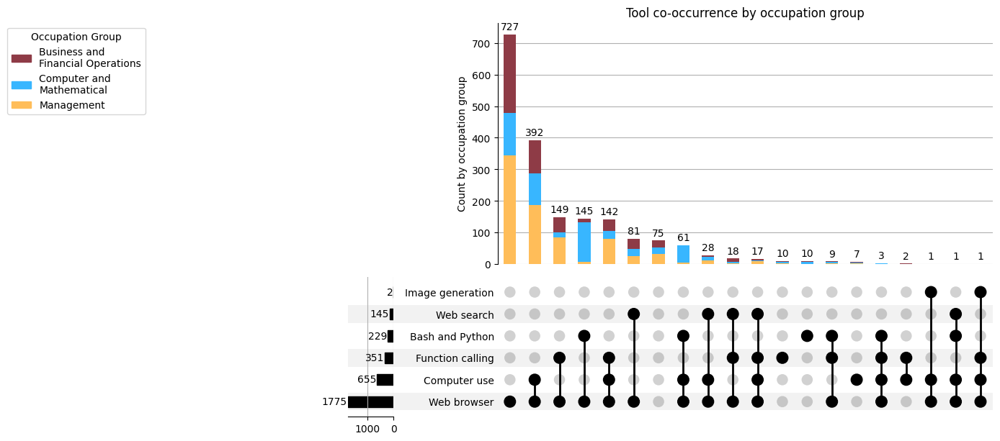

In [175]:
from matplotlib import cm
from matplotlib.patches import Patch

bar_colors = ['#8E3B46', '#38B6FF','#FFBD59' ]

# Your long labels with manual line breaks for two lines
labels = [
    'Business and\nFinancial Operations',
    'Computer and\nMathematical',
    'Management'
]

patches = [Patch(color=bar_colors[i], label=labels[i]) for i in range(len(labels))]

# Create and plot the UpSet plot
upset = UpSet(data, sort_by='cardinality', 
              intersection_plot_elements=0, 
              show_counts = True)
upset.add_stacked_bars(by="occupation_group", title="Count by occupation group", elements=10, colors=bar_colors)
# upset.style_categories(
#     "Practical exam possible",
#     shading_facecolor="lavender",
# )
upset.plot()

# Add the legend once with custom patches and position
plt.legend(handles=patches, title="Occupation Group", bbox_to_anchor=(-1, 1), loc='upper left')

plt.title('Tool co-occurrence by occupation group')
plt.show()

## Same for materials

In [188]:
experiments['LLM_tools'] = experiments['required_tools'].apply(contains_target_values)
def ensure_iterable(x):
    if isinstance(x, bool):  # or you can check if not iterable
        return []
    elif isinstance(x, str):
        return [x]  # wrap string into list
    else:
        return x

In [153]:
experiments['required_tools'].apply(ast.literal_eval)

ValueError: malformed node or string: nan

In [ ]:
#experiments['required_materials'] = experiments['required_materials'].apply(ensure_iterable)

In [189]:
# Convert list of label lists to a binary indicator DataFrame
mlb = MultiLabelBinarizer()
experiments.dropna(subset='required_materials', inplace=True)
binary_matrix = mlb.fit_transform(list(experiments['required_materials'].apply(ast.literal_eval)))
df_labels = pd.DataFrame(binary_matrix, columns=mlb.classes_).astype(bool)
df_labels = pd.concat([df_labels, experiments['occupation_group'].reset_index()], axis=1).drop('index',axis=1)

In [155]:
df_labels

,Audio files,Data,Images,Specialized files,Speicalized files,Text,Video files,Virtual labs,occupation_group
0,False,True,True,False,False,True,False,False,business_and_financial_operations_occupations
1,False,True,True,False,False,True,False,False,business_and_financial_operations_occupations
2,False,True,True,False,False,True,False,True,business_and_financial_operations_occupations
3,False,True,True,False,False,True,False,False,business_and_financial_operations_occupations
4,False,True,False,False,False,True,False,True,business_and_financial_operations_occupations
...,...,...,...,...,...,...,...,...,...
1983,False,True,True,True,False,True,False,False,management_occupations
1984,False,True,True,True,False,True,False,True,management_occupations
1985,False,True,True,True,False,True,False,True,management_occupations
1986,False,True,True,False,False,True,True,True,management_occupations


In [190]:
#df_labels = pd.concat([df_labels[['Code interpreter', 'Computer use', 'Function calling','Image generation']], experiments['occupation_group']], axis=1)
multi_index = pd.MultiIndex.from_frame(df_labels[['Text', 'Data','Images','Audio files','Video files','Virtual labs','Specialized files']], names=['Text', 'Data','Images','Audio files','Video files','Virtual labs','Specialized files'
                                                  ] )
data = df_labels.set_index(multi_index)

/var/folders/6f/4d4gdl2s62qcjzl2lxz8l5zc0000gq/T/ipykernel_4273/1865988101.py:793: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  styles["linewidth"].fillna(1, inplace=True)
/var/folders/6f/4d4gdl2s62qcjzl2lxz8l5zc0000gq/T/ipykernel_4273/1865988101.py:794: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always 

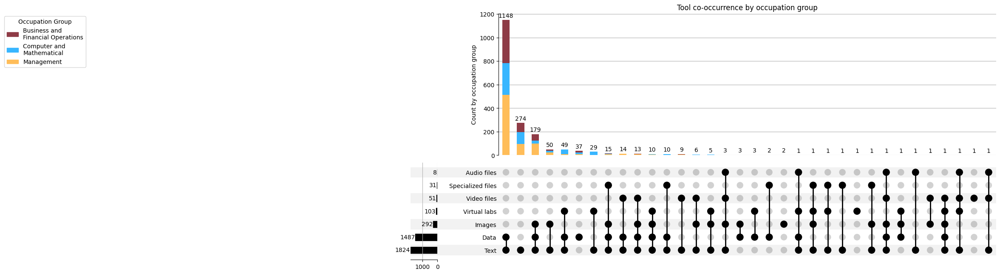

In [191]:
from matplotlib import cm
from matplotlib.patches import Patch

bar_colors = ['#8E3B46', '#38B6FF','#FFBD59' ]

# Your long labels with manual line breaks for two lines
labels = [
    'Business and\nFinancial Operations',
    'Computer and\nMathematical',
    'Management'
]

patches = [Patch(color=bar_colors[i], label=labels[i]) for i in range(len(labels))]

# Create and plot the UpSet plot
upset = UpSet(data, sort_by='cardinality', 
              intersection_plot_elements=0, 
              show_counts = True)
upset.add_stacked_bars(by="occupation_group", title="Count by occupation group", elements=10, colors=bar_colors)
# upset.style_categories(
#     "Practical exam possible",
#     shading_facecolor="lavender",
# )
upset.plot()

# Add the legend once with custom patches and position
plt.legend(handles=patches, title="Occupation Group", bbox_to_anchor=(-1, 1), loc='upper left')

plt.title('Tool co-occurrence by occupation group')
plt.show()

Successfully saved figure to  ../results/figures/experiments/claude-3-7-sonnet-20250219_tools_materials_requirements_experiment1.pdf


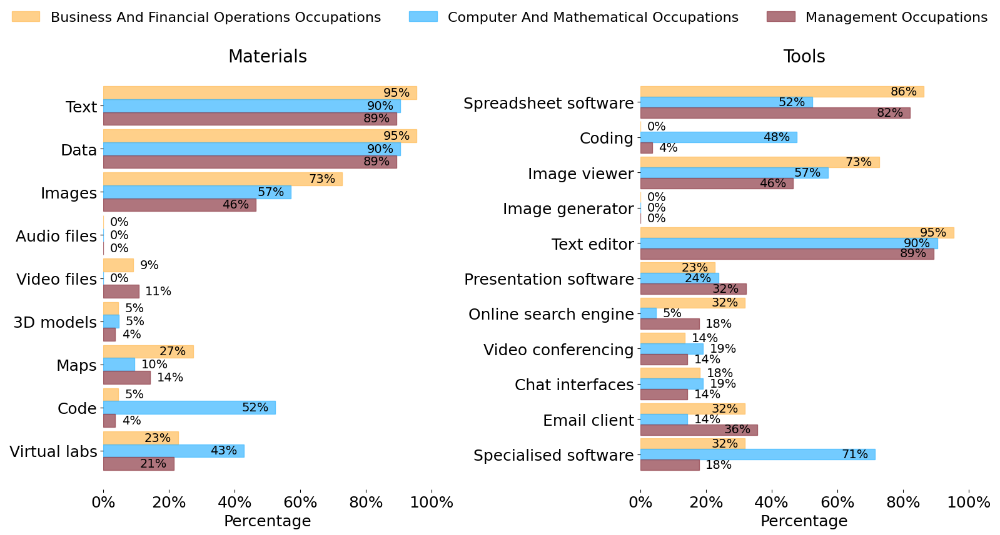

In [50]:

# Print the number of tasks in the file

# # preprocess data to extract materials and tools lists
materials_data, tools_data = preprocess_materials_tools(experiments, occupations_file_names)

model ='claude-3-7-sonnet-20250219'
# # create figure showing percetages of tools and materials required for each occupation group
plot_tools_materials_requirements(materials_data, tools_data, f'../results/figures/experiments/{model}_tools_materials_requirements_experiment1.pdf', occupations_file_names)


In [7]:
tools_dict = {"Data management software": "Function calling",
"Numerical analysis software": "Function calling",
"Coding": "Code interpreter",
"Text editor": "None",
"Image viewer": "Function calling",
"Presentation software": "Computer use",
"Image generator": "Image generation",
"Online search engine": "Web search",
"Video conferencing": "Computer use",
"Chat interfaces": "None",
"Email client": "Computer use",
"Specialised software": "Computer use"}

In [57]:
experiments['tools.Specialised software']

0     Not Required
10    Not Required
47    Not Required
52    Not Required
66    Not Required
Name: tools.Specialised software, dtype: object

In [60]:
experiments[experiments['tools.Specialised software']=='Required']

,Unnamed: 0,row,prompt,task_id,occupation,task_description,can_be_performed_remotely,feasiblity_practical,chain_of_thought,materials.Text,...,tools.Online search engine,tools.Video conferencing,tools.Chat interfaces,tools.Email client,tools.Specialised software,required_tools,required_tools_standard,required_materials,required_materials_standard,occupation_group
1,1,42,Task ID: 1155.0\n\nYour assignment is to deter...,1155.0,"Purchasing Agents, Except Wholesale, Retail, a...",Arrange the payment of duty and freight charges.,True,True,Arranging payment of duty and freight charges ...,Required,...,Not Required,Not Required,Not Required,Required,Required,"['Spreadsheet software', 'Image viewer', 'Text...","['Spreadsheet software', 'Image viewer', 'Text...","['Text', 'Data', 'Images']","['Text', 'Data', 'Images']",business_and_financial_operations_occupations
3,3,115,Task ID: 8916.0\n\nYour assignment is to deter...,8916.0,Coroners,Observe and record the positions and condition...,True,True,While actual coroner work requires physical pr...,Required,...,Not Required,Not Required,Not Required,Not Required,Required,"['Spreadsheet software', 'Image viewer', 'Text...","['Spreadsheet software', 'Image viewer', 'Text...","['Text', 'Data', 'Images', 'Video files', '3D ...","['Text', 'Data', 'Images', 'Video files', '3D ...",business_and_financial_operations_occupations
6,6,160,Task ID: 15937.0\n\nYour assignment is to dete...,15937.0,Customs Brokers,Monitor or trace the location of goods.,True,True,Customs brokers can monitor goods remotely usi...,Required,...,Required,Not Required,Not Required,Required,Required,"['Spreadsheet software', 'Image viewer', 'Text...","['Spreadsheet software', 'Image viewer', 'Text...","['Text', 'Data', 'Images', 'Maps']","['Text', 'Data', 'Images', 'Maps']",business_and_financial_operations_occupations
9,9,182,Task ID: 18859.0\n\nYour assignment is to dete...,18859.0,Human Resources Specialists,Hire employees and process hiring-related pape...,True,True,Hiring and processing paperwork can be perform...,Required,...,Not Required,Not Required,Not Required,Required,Required,"['Spreadsheet software', 'Text editor', 'Email...","['Spreadsheet software', 'Text editor', 'Email...","['Text', 'Data']","['Text', 'Data']",business_and_financial_operations_occupations
11,11,247,Task ID: 8951.0\n\nYour assignment is to deter...,8951.0,Logisticians,Manage the logistical aspects of product life ...,True,True,Logistical management of product life cycles c...,Required,...,Not Required,Not Required,Not Required,Not Required,Required,"['Spreadsheet software', 'Image viewer', 'Text...","['Spreadsheet software', 'Image viewer', 'Text...","['Text', 'Data', 'Images', 'Virtual labs']","['Text', 'Data', 'Images', 'Virtual labs']",business_and_financial_operations_occupations
20,20,483,Task ID: 21508.0\n\nYour assignment is to dete...,21508.0,Accountants and Auditors,Inspect account books and accounting systems f...,True,True,Inspecting account books and accounting system...,Required,...,Not Required,Not Required,Not Required,Not Required,Required,"['Spreadsheet software', 'Image viewer', 'Text...","['Spreadsheet software', 'Image viewer', 'Text...","['Text', 'Data', 'Images', 'Virtual labs']","['Text', 'Data', 'Images', 'Virtual labs']",business_and_financial_operations_occupations
21,21,496,Task ID: 21521.0\n\nYour assignment is to dete...,21521.0,Accountants and Auditors,"Develop, implement, modify, and document recor...",True,True,Developing accounting systems can be performed...,Required,...,Not Required,Not Required,Not Required,Not Required,Required,"['Spreadsheet software', 'Text editor', 'Speci...","['Spreadsheet software', 'Text editor', 'Speci...","['Text', 'Data', 'Virtual labs']","['Text', 'Data', 'Virtual labs']",business_and_financial_operations_occupations
23,1,72,Task ID: 19007.0\n\nYour assignment is to dete...,19007.0,Computer Network Support Specialists,Document help desk requests and resolutions.,True,True,Document

In [51]:
experiments = experiments.dropna(subset = ['required_tools_standard'])
experiments['LLM tools'] = experiments['required_tools_standard'].apply(lambda lst: [tools_dict.get(item,item) for item in ast.literal_eval(lst)])

In [ ]:
{"Data management software": "Function calling",
"Numerical analysis software": "Function calling",
"Coding": "Code interpreter",
"Text editor": "None",
"Image viewer": "Function calling",
"Presentation software": "Computer use",
"Image generator": "Image generation",
"Online search engine": "Web search",
"Video conferencing": "Computer use",
"Chat interfaces": "None",
"Email client": "Computer use",
"Specialised software": "Computer use"}

In [61]:
exclusion_tools = ['Presentation software', 'Image generator', 'Online search engine','Email client','Chat interfaces','Video conferencing','Specialised software','Coding','Image viewer']
exclusion_materials = ['Images', 'Audio files', 'Video files', '3D models','Maps','Code','Virtual labs']

exclusion_tools = ['tools.' + item for item in exclusion_tools]  # Modify tool names to match the column names
exclusion_materials = ['materials.' + item for item in exclusion_materials]  # Modify material names to match the column names

In [63]:
experiments = experiments[experiments['task_id'].isin(df_all['task_id'])]
experiments.shape

(5, 34)

In [65]:
21920+417089

439009

In [62]:


print('Overall ', experiments.shape[0], ' tasks in the data')  # Print the number of tasks in the file

print('Exclusion tools: ', exclusion_tools)
# Filter out tasks based on the exclusion tools
excluded_tools = list(experiments.loc[(experiments[exclusion_tools] == 'Required').sum(axis=1) >= 1, 'task_id'])
print(len(excluded_tools), ' tasks excluded based on tools')

print('Exclusion materials: ', exclusion_materials)
# Further filter out tasks based on the exclusion materials
excluded_mat=  list(experiments.loc[(experiments[exclusion_materials] == 'Required').sum(axis=1) >= 1, 'task_id'])
print(len(excluded_mat), ' tasks excluded based on materials')

exlcuded_remote = list(experiments.loc[experiments['can_be_performed_remotely']==False, 'task_id'])
print(len(exlcuded_remote), ' tasks excluded based on remote infeasibility')

exlcuded_practical = list(experiments.loc[experiments['feasiblity_practical']==False, 'task_id'])
print(len(exlcuded_practical), ' tasks excluded based on practical infeasibility')


excluded_ids = excluded_tools + excluded_mat + exlcuded_remote + exlcuded_practical
excluded_ids = list(set(excluded_ids))  # Remove duplicates
print(len(excluded_ids), ' tasks excluded in total')

experiments= experiments[~experiments['task_id'].isin(excluded_ids)]  # Filter out excluded tasks
print('Remaining tasks: ', experiments.shape[0])

Overall  71  tasks in the data
Exclusion tools:  ['tools.Presentation software', 'tools.Image generator', 'tools.Online search engine', 'tools.Email client', 'tools.Chat interfaces', 'tools.Video conferencing', 'tools.Specialised software', 'tools.Coding', 'tools.Image viewer']
59  tasks excluded based on tools
Exclusion materials:  ['materials.Images', 'materials.Audio files', 'materials.Video files', 'materials.3D models', 'materials.Maps', 'materials.Code', 'materials.Virtual labs']
49  tasks excluded based on materials
2  tasks excluded based on remote infeasibility
2  tasks excluded based on practical infeasibility
61  tasks excluded in total
Remaining tasks:  10


In [26]:
old_path = '../data/required_materials_tools/claude-3-7-sonnet-20250219/'
df_all = read_in_data(occupations_file_names,f'{old_path}materials_tools_')
# Print the number of tasks in the file

# filter to experiment ids
df_all = df_all[df_all['task_id'].isin(experiments['task_id'])]
df_all.shape

(60, 32)

In [13]:
import numpy as np
x=0
x**4+x**3-np.sqrt(x**2+2) -4*x**2-4*x+1

np.float64(-0.41421356237309515)

In [72]:
experiments[~experiments['task_id'].isin(df_all['task_id'])]

,Unnamed: 0,row,prompt,task_id,occupation,task_description,can_be_performed_remotely,feasiblity_practical,fact_based_scoring,chain_of_thought,...,materials.Audio files,materials.Video files,materials.3D models,materials.Maps,materials.Code,required_tools,required_tools_standard,required_materials,required_materials_standard,occupation_group
45,2,88,Task ID: 3259\n\nYour assignment is to determi...,3259.0,Public Relations and Fundraising Managers,Respond to requests for information about empl...,True,True,True,Responding to information requests is a core P...,...,Not Required,Not Required,Not Required,Not Required,Not Required,"['Text editor', 'Online search engine', 'Chat ...","['Text editor', 'Online search engine', 'Chat ...","['Text', 'Data']","['Text', 'Data']",management_occupations
49,6,222,Task ID: 1046\n\nYour assignment is to determi...,1046.0,Transportation Managers,Monitor spending to ensure that expenses are c...,True,True,True,Monitoring transportation spending against bud...,...,Not Required,Not Required,Not Required,Not Required,Not Required,['Text editor'],['Text editor'],"['Text', 'Data']","['Text', 'Data']",management_occupations
50,7,227,Task ID: 1050\n\nYour assignment is to determi...,1050.0,Transportation Managers,Analyze expenditures and other financial infor...,True,True,True,Financial analysis and budget planning can be ...,...,Not Required,Not Required,Not Required,Not Required,Not Required,"['Text editor', 'Presentation software']","['Text editor', 'Presentation software']","['Text', 'Data']","['Text', 'Data']",management_occupations
51,8,236,Task ID: 3292\n\nYour assignment is to determi...,3292.0,Storage and Distribution Managers,"Plan, develop, or implement warehouse safety a...",True,True,True,Planning warehouse safety programs can be done...,...,Not Required,Required,Not Required,Required,Not Required,"['Text editor', 'Presentation software', 'Onli...","['Text editor', 'Presentation software', 'Onli...","['Text', 'Data', 'Images', 'Video files', 'Maps']","['Text', 'Data', 'Images', 'Video files', 'Maps']",management_occupations
57,14,459,Task ID: 15542\n\nYour assignment is to determ...,15542.0,Distance Learning Coordinators,Prepare and distribute schedules of distance l...,True,True,True,Preparing and distributing schedules of distan...,...,Not Required,Not Required,Not Required,Not Required,Not Required,"['Text editor', 'Presentation software', 'Emai...","['Text editor', 'Presentation software', 'Emai...","['Text', 'Data']","['Text', 'Data']",management_occupations
59,16,481,Task ID: 20314\n\nYour assignment is to determ...,20314.0,Fitness and Wellness Coordinators,Interpret insurance data or Health Reimburseme...,True,True,True,This task involves analyzing insurance/HRA dat...,...,Not Required,Not Required,Not Required,Not Required,Not Required,"['Text editor', 'Presentation software']","['Text editor', 'Presentation software']","['Text', 'Data']","['Text', 'Data']",management_occupations
68,25,808,Task ID: 15774\n\nYour assignment is to determ...,15774.0,Security Managers,Conduct physical examinations of property to e...,False,False,False,Physical examinations of property inherently r...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,management_occupations


In [63]:
df_all

,Unnamed: 0.1,Unnamed: 0,row,prompt,task_id,occupation,task_description,can_be_performed_remotely,feasiblity_practical,chain_of_thought,...,materials.Audio files,materials.Video files,materials.Virtual labs or sandbox environments,materials.Other.name,materials.Other.classification,required_tools,required_tools_standard,required_materials,required_materials_standard,occupation_group
106,106.0,106,106,\nTask ID: 18868.0\n\nYour assignment is to de...,18868.0,Human Resources Specialists,Review employment applications and job orders ...,True,True,This task can be performed remotely as it invo...,...,Not Required,Not Required,Not Required,Sample job descriptions and resumes,Required,"['Spreadsheets', 'Text editor', 'PDF viewer', ...","['Spreadsheets', 'Text editor', 'PDF viewer']","['Text', 'Data', 'Sample job descriptions and ...","['Text', 'Data']",business_and_financial_operations_occupations
1201,NaN,526,526,\nTask ID: 16278.0\n\nYour assignment is to de...,16278.0,Clinical Data Managers,Perform quality control audits to ensure accur...,True,True,Quality control audits for clinical data can b...,...,Not Required,Not Required,Required,Standard Operating Procedures (SOPs) and audit...,Required,"['Spreadsheets', 'Text editor', 'PDF viewer', ...","['Spreadsheets', 'Text editor', 'PDF viewer']","['Text', 'Data', 'Images', 'Virtual labs or sa...","['Text', 'Data', 'Images', 'Virtual labs or sa...",computer_and_mathematical_occupations
1972,NaN,750,750,\nTask ID: 15638.0\n\nYour assignment is to de...,15638.0,Compliance Managers,Maintain documentation of compliance activitie...,True,True,This task involves documenting compliance acti...,...,Not Required,Not Required,Required,Sample compliance documentation templates,Required,"['Spreadsheets', 'Text editor', 'PDF viewer', ...","['Spreadsheets', 'Text editor', 'PDF viewer']","['Text', 'Data', 'Virtual labs or sandbox envi...","['Text', 'Data', 'Virtual labs or sandbox envi...",management_occupations


Successfully saved figure to  ../results/figures/experiments/claude-3-7-sonnet-20250219_tools_materials_requirements.pdf


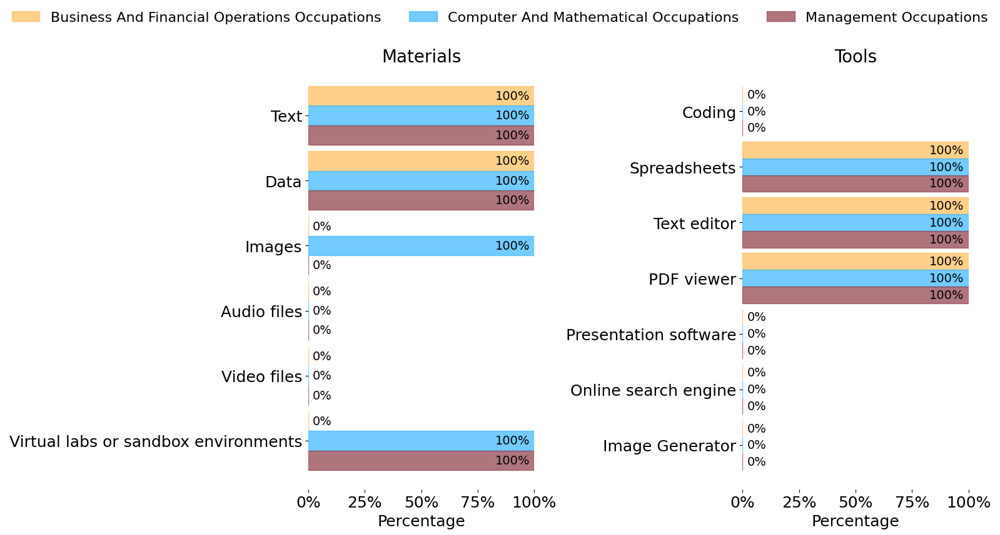

In [65]:


# # preprocess data to extract materials and tools lists
materials_data, tools_data = preprocess_materials_tools(df_all, occupations_file_names)

model ='claude-3-7-sonnet-20250219'
# # create figure showing percetages of tools and materials required for each occupation group
plot_tools_materials_requirements(materials_data, tools_data, f'../results/figures/experiments/{model}_tools_materials_requirements.pdf', occupations_file_names)


In [44]:
exclusion_tools = ['Presentation software', 'Image Generator', 'Online search engine']
exclusion_materials = ['Images', 'Audio files', 'Video files', 'Virtual labs or sandbox environments']

exclusion_tools = ['tools.' + item for item in exclusion_tools]  # Modify tool names to match the column names
exclusion_materials = ['materials.' + item for item in exclusion_materials]  # Modify material names to match the column names


In [47]:
print('Overall ', df_all.shape[0], ' tasks in the data')  # Print the number of tasks in the file

print('Exclusion tools: ', exclusion_tools)
# Filter out tasks based on the exclusion tools
excluded_tools = list(df_all.loc[(df_all[exclusion_tools] == 'Required').sum(axis=1) >= 1, 'task_id'])
print(len(excluded_tools), ' tasks excluded based on tools')

print('Exclusion materials: ', exclusion_materials)
# Further filter out tasks based on the exclusion materials
excluded_mat=  list(df_all.loc[(df_all[exclusion_materials] == 'Required').sum(axis=1) >= 1, 'task_id'])
print(len(excluded_mat), ' tasks excluded based on materials')

exlcuded_remote = list(df_all.loc[df_all['can_be_performed_remotely']==False, 'task_id'])
print(len(exlcuded_remote), ' tasks excluded based on remote infeasibility')

exlcuded_practical = list(df_all.loc[df_all['feasiblity_practical']==False, 'task_id'])
print(len(exlcuded_practical), ' tasks excluded based on practical infeasibility')


excluded_ids = excluded_tools + excluded_mat + exlcuded_remote + exlcuded_practical
excluded_ids = list(set(excluded_ids))  # Remove duplicates
print(len(excluded_ids), ' tasks excluded in total')

df_all= df_all[~df_all['task_id'].isin(excluded_ids)]  # Filter out excluded tasks
print('Remaining tasks: ', df_all.shape[0])

Overall  64  tasks in the data
Exclusion tools:  ['tools.Presentation software', 'tools.Image Generator', 'tools.Online search engine']
39  tasks excluded based on tools
Exclusion materials:  ['materials.Images', 'materials.Audio files', 'materials.Video files', 'materials.Virtual labs or sandbox environments']
54  tasks excluded based on materials
3  tasks excluded based on remote infeasibility
5  tasks excluded based on practical infeasibility
62  tasks excluded in total
Remaining tasks:  2
